In [263]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from datetime import datetime
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 30)
pd.options.display.width = None
from glob import glob as g
import matplotlib as plot
import logging
import time
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(message)s')
import random
pd.set_option('display.max_colwidth', 50)

import matplotlib.pyplot as plt

# Change the default settings of matplotlib
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 14
plt.rcParams['figure.dpi'] = 300  # Set the DPI to 100 globally

In [264]:
finasteride = pd.read_csv('/Users/mac/Downloads/Notebooks/Peer_review_data/diabetic_cohort_with_T2DMdrugs_finasteride')
tamsulosin = pd.read_csv('/Users/mac/Downloads/Notebooks/Peer_review_data/diabetic_cohort_with_T2DMdrugs_tamsulosin')

In [265]:
#take out the year value in the date_dispensed column and count the unique number of years
finasteride['year'] = finasteride['DATE_DISPENSED'].str[:4]
finasteride['year'].value_counts()

2016    189
2017    189
2015    159
2013    156
2014    141
2012    112
2010    111
2011    102
2009     85
2008     15
Name: year, dtype: int64

In [266]:
#take out the year value in the date_dispensed column and count the unique number of years
tamsulosin['year'] = tamsulosin['DATE_DISPENSED'].str[:4]
tamsulosin['year'].value_counts()

2017    145
2016    131
2014     80
2015     77
2013     64
2012     43
2011     30
2010     10
Name: year, dtype: int64

In [267]:
#Reassign the treament group
print(f'There are {len(tamsulosin)} patients in the tamsulosin group')
tamsulosin['Treatment'] = 1

print(f'There are {len(finasteride)} patients in the finasteride group')
finasteride['Treatment'] = 0

There are 580 patients in the tamsulosin group
There are 1259 patients in the finasteride group


In [275]:
#median of duration_year for finasteride
print(f"The median duration following-up of finasteride is :{finasteride['duration_year'].median()}") 
#median of duration_year for tamsulosin
print(f"The median duration following-up of finasteride is :{tamsulosin['duration_year'].median()}") 

The median duration following-up of finasteride is :2.4421629021218343
The median duration following-up of finasteride is :1.6153319644079398


In [268]:
import matplotlib
print(matplotlib.get_cachedir())


/Users/mac/.matplotlib


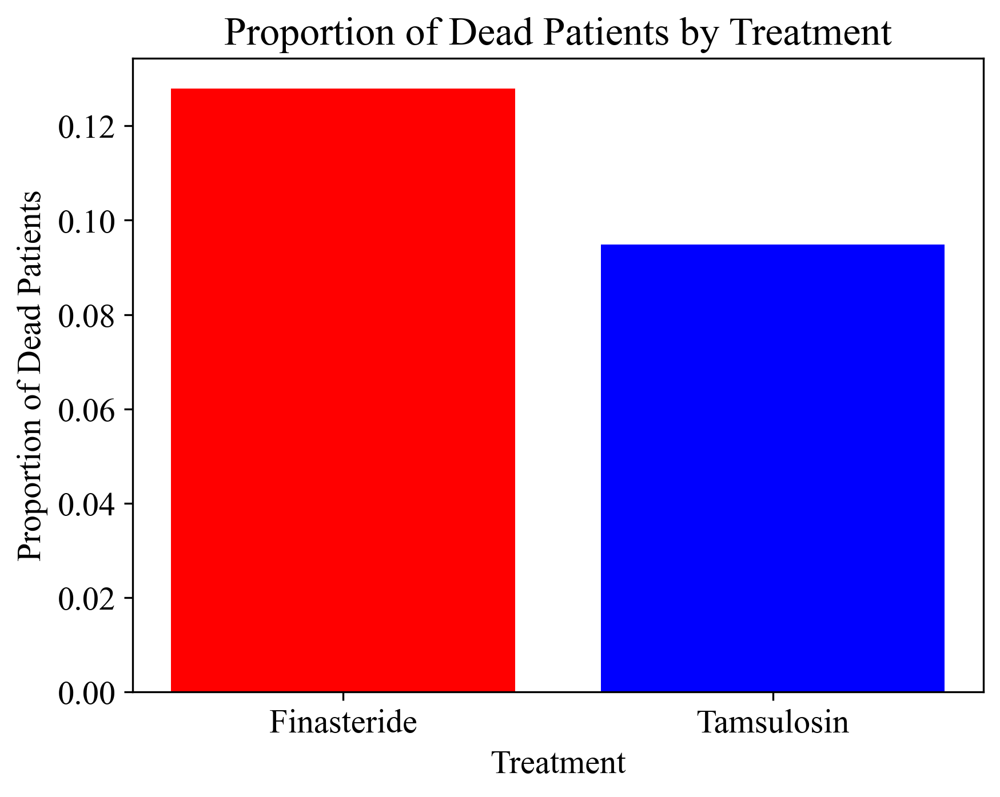

Death account for 0.13 of finasteride group.
Death account for 0.09 of tamsulosin group.


In [269]:
# Create a new column 'is_dead' based on 'DOD'
finasteride['is_dead'] = np.where(finasteride['DOD'].notnull() & finasteride['DATE_DISPENSED_insulin'].isnull(), 1, 0)
tamsulosin['is_dead'] = np.where(tamsulosin['DOD'].notnull() & tamsulosin['DATE_DISPENSED_insulin'].isnull(), 1, 0)

# Calculate the proportion of dead patients for each treatment
prop_dead_finasteride = finasteride['is_dead'].mean()
prop_dead_tamsulosin = tamsulosin['is_dead'].mean()

# Data to plot
proportions = [prop_dead_finasteride, prop_dead_tamsulosin]
treatment_labels = ['Finasteride', 'Tamsulosin']

# Create bar plot
plt.bar(treatment_labels, proportions, color=['red', 'blue'])
plt.xlabel('Treatment')
plt.ylabel('Proportion of Dead Patients')
plt.title('Proportion of Dead Patients by Treatment')
plt.show()

print(f'Death account for {round(prop_dead_finasteride,2)} of finasteride group.')
print(f'Death account for {round(prop_dead_tamsulosin,2)} of tamsulosin group.')

## Fix up data sets

### mapping ethnicity variables

In [270]:
# Create a function to map original ethnicity codes to the new grouped categories
def group_and_map_ethnicity(df, ethnicity):
    # Create a function to map original ethnicity codes to the new grouped categories
    def map_ethnicity(ethnicity_code):
        if ethnicity_code in [11, 12, 10]:
            return 'European'
        elif ethnicity_code in [40, 41, 42, 43, 44, 51]:
            return 'Asian'
        elif ethnicity_code in [21, 31, 33, 35, 36, 34, 37]:
            return 'Indigenous'
        else:
            return 'Not_Stated/Other/Unknown'

    # Apply the map_ethnicity function to create a new ethnicity_grouped column
    df['ethnicity_grouped'] = df[ethnicity].apply(map_ethnicity)

    # Create dummy variables for the ethnicity_grouped categories
    ethnicity_grouped_dummies = pd.get_dummies(df['ethnicity_grouped'], prefix='ethnicity')

    # Convert the ethnicity_grouped variable to categorical format in pandas DataFrame
    df['ethnicity_grouped'] = df['ethnicity_grouped'].astype('category')

    # Concatenate the dummy variables with the original DataFrame
    df = pd.concat([df, ethnicity_grouped_dummies], axis=1)

    return df


In [271]:
finasteride_df = finasteride.copy()
tamsulosin_df = tamsulosin.copy()

# Apply ethnicity function
finasteride_df= group_and_map_ethnicity(finasteride_df, 'ethnicity') 
tamsulosin_df= group_and_map_ethnicity(tamsulosin_df, 'ethnicity') 

In [272]:
finasteride_df

,new_enc_nhi,QUANTITY_DISPENSED,DATE_DISPENSED,QUANTITY_DISPENSED_insulin,DATE_DISPENSED_insulin,Age_diagnosis,Gender,ethnicity,diagnosis,diabetes_date,second_hospitalisation_date,birth_year,DOD,AGE_AT_DEATH_YRS,start_age,insulin_status,end_date,duration_year,cci_score,diabetes_duration,Treatment,ACE_inhibitors,ARBs,Beta_blocker,corticosteroid,diuretics,statin,metformin,sulfonylureas,acarbose,GLP_1,DPP_4,SGLT_2,year,is_dead,ethnicity_grouped,ethnicity_Asian,ethnicity_European,ethnicity_Indigenous,ethnicity_Not_Stated/Other/Unknown
0,aTRQ1WPF5NR,2023.0,2008-10-22,NaN,NaN,84,1,11,"S325, E1140, I951, E1160, I10, Z509, K590, D64...",2004-04-27,2007-12-15,1920,2014-02-12,94.0,88,0,2014-02-12,5.308693,11,4.487337,0,1,1,1,0,0,1,0,0,0,0,0,0,2008,1,European,0,1,0,0
1,IQ5JdDe8BKt,1955.0,2008-11-03,NaN,NaN,63,1,11,"I500, E1120, E1160, N1890, I10, Z8643, R31, I2...",2000-05-30,2000-11-23,1937,NaN,NaN,71,0,2017-12-31,9.158111,21,8.429843,0,1,1,0,0,1,1,1,0,0,0,0,0,2008,0,European,0,1,0,0
2,e.qa1ETYM.v,870.0,2008-11-07,NaN,NaN,77,1,11,"E1130, H358, Z961, E1170, N1891, C782, C343, E...",2008-01-22,2010-11-15,1931,2011-03-06,81.0,77,0,2011-03-06,2.324435,21,0.793977,0,0,0,0,0,0,1,1,1,0,0,0,0,2008,1,European,0,1,0,0
3,Y./T1W0UVJv,90.0,2008-11-08,NaN,NaN,72,1,11,"J81, E1180, Z958, S3314, E1190, E780, Z720",2002-12-27,2005-03-18,1930,2013-04-09,82.0,78,0,2013-04-09,4.416153,6,5.867214,0,0,1,0,0,1,0,1,1,0,0,0,0,2008,1,European,0,1,0,0
4,JejWTXQdcaD,103.0,2008-11-14,NaN,NaN,77,1,11,"Z508, C182, T814, N390, E1160, E669, I10, M480...",1998-09-11,2000-11-18,1921,2009-07-15,88.0,87,0,2009-07-15,0.665298,17,10.176591,0,1,0,1,0,1,1,1,1,0,0,0,0,2008,1,European,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254,IXWGdV7e.9y,90.0,2017-12-06,NaN,NaN,75,1,32,"R91, E1190, Z8643, J90, R33, C341",2016-08-15,2017-10-15,1941,NaN,NaN,76,0,2017-12-31,0.068446,6,1.308693,0,1,0,0,0,1,1,1,0,0,0,0,0,2017,0,Not_Stated/Other/Unknown,0,0,0,1
1255,h4Wrl53dBJG,90.0,2017-12-14,NaN,NaN,66,1,54,"H024, E1190, Z8643, I214, I10, E1160, E785, I2...",2001-06-29,2001-07-29,1935,NaN,NaN,82,0,2017-12-31,0.046543,9,16.459959,0,0,1,1,0,0,1,1,0,0,0,0,0,2017,0,Not_Stated/Other/Unknown,0,0,0,1
1256,m471960ZG/z,90.0,2017-12-20,NaN,NaN,69,1,11,"K566, K660, I10, E1160",2011-06-20,NaN,1942,NaN,NaN,75,0,2017-12-31,0.030116,3,6.502396,0,1,0,0,0,0,0,1,0,0,0,0,0,2017,0,European,0,1,0,0
1257,.B/RZ1X88id,90.0,2017-12-28,NaN,NaN,74,1,31,"H251, E1130, Z8643",2017-10-24,NaN,1943,NaN,NaN,74,0,2017-12-31,0.008214,5,0.177960,0,1,0,0,0,0,1,1,0,0,0,0,0,2017,0,Indigenous,0,0,1,0


## Summary table

In [273]:
fin_tam_df = pd.concat([tamsulosin_df, finasteride_df], axis = 0)

In [190]:
from scipy.stats import ttest_ind, ranksums, chi2_contingency

def summarize_variables(df, variables, grouped_variables):
    summary_rows = []
    # Create the summary row
    summary_row = {
    'Variable': 'Number of Patients',
    'Tamsulosin': len(df[df['Treatment'] == 1]),
    'Finasteride': len(df[df['Treatment'] == 0]),
    }
    # Append the summary row to the list
    summary_rows.append(summary_row)
    for category, var_list in grouped_variables.items():  
        summary_rows.append({'Variable': category, 'Tamsulosin': '', 'Finasteride': '', 'p-value': ''})      
        for variable in var_list:
            if variable in variables:
                row_data = {'Variable': f"  {variable}"}
                for treatment, treatment_name in [(1, 'Tamsulosin'), (0, 'Finasteride')]:
                    group = df[df['Treatment'] == treatment]
                    if variable in ['start_age', 'duration_year']:
                        mean = group[variable].mean()
                        std = group[variable].std()
                        value = f"{mean:.2f} ({std:.2f})"
                    elif variable in ['diabetes_duration','cci_score']:
                        median = group[variable].median()
                        iqr = group[variable].quantile(0.75) - group[variable].quantile(0.25)
                        value = f"{median:.2f} ({iqr:.2f})"
                    else:
                        count = group[variable].sum()
                        percentage = (count / len(group)) * 100
                        value = f"{count} ({percentage:.2f}%)"
                        
                    row_data[treatment_name] = value
                
                if category != 'Ethnicity':
                    # Conduct appropriate statistical test and get p-value
                    if variable in ['start_age', 'duration_year']:
                        _, p_value = ttest_ind(df[df['Treatment'] == 0][variable], df[df['Treatment'] == 1][variable])
                    elif variable in ['diabetes_duration','cci_score']:
                        _, p_value = ranksums(df[df['Treatment'] == 0][variable], df[df['Treatment'] == 1][variable])
                    else:
                        contingency_table = pd.crosstab(df['Treatment'], df[variable])
                        _, p_value, _, _ = chi2_contingency(contingency_table)
                    row_data['p-value'] = f"{p_value:.3f}"
                else:
                    row_data['p-value'] = ''

                summary_rows.append(row_data)
            
        if category == 'Ethnicity':
            row_data = {'Variable': f"  {category} (all)", 'Tamsulosin': '', 'Finasteride': '', 'p-value': ''}
            # Conduct chi-square test for the whole ethnicity variable
            contingency_table = pd.crosstab(df['Treatment'], [df[var] for var in var_list])
            _, p_value, _, _ = chi2_contingency(contingency_table)
            row_data['p-value'] = f"{p_value:.3f}"
            summary_rows.append(row_data)

    summary_table = pd.DataFrame(summary_rows)
    return summary_table

grouped_variables = {
    '': ['start_age', #'second_hospitalisation'
         'duration_year', 'cci_score', 'diabetes_duration'],
         'Diabetes medication': ['metformin','sulfonylureas','acarbose','GLP_1','DPP_4','SGLT_2'],
    'Other drug use': ['ACE_inhibitors', 'ARBs', 'Beta_blocker', 'corticosteroid', 'diuretics', 'statin'],
    'Ethnicity': ['ethnicity_European','ethnicity_Asian', 
                  'ethnicity_Indigenous', 'ethnicity_Not_Stated/Other/Unknown']
}
summary_variables = ['duration_year', #just to check- to be removed
   'start_age','diabetes_duration', 'cci_score',#'second_hospitalisation',
   'ACE_inhibitors', 'ARBs' ,'Beta_blocker', 'corticosteroid', 'diuretics', 'statin',
   'metformin','sulfonylureas','acarbose','GLP_1','DPP_4','SGLT_2',
   'ethnicity_European','ethnicity_Asian', 'ethnicity_Indigenous', 'ethnicity_Not_Stated/Other/Unknown',
]

In [191]:
summarize_variables(fin_tam_df, summary_variables, grouped_variables)

,Variable,Tamsulosin,Finasteride,p-value
0,Number of Patients,580,1259,NaN
1,,,,
2,start_age,74.77 (8.69),75.24 (8.29),0.268
3,duration_year,2.05 (1.66),2.99 (2.30),0.000
4,cci_score,9.00 (7.00),9.00 (8.00),0.071
5,diabetes_duration,4.83 (7.85),4.99 (7.32),0.404
6,Diabetes medication,,,
7,metformin,472 (81.38%),1003 (79.67%),0.427
8,sulfonylureas,274 (47.24%),567 (45.04%),0.405
9,acarbose,0 (0.00%),0 (0.00%),1.000


#### Sumary table for weighted propensity

In [192]:
#Calculate standardized difference
def calculate_standardized_diff(df, variable, for_means):
    tamsulosin_group = df[df['Treatment'] == 1][variable]
    finasteride_group = df[df['Treatment'] == 0][variable]
    
    if for_means: #for continuos variable
        mean_tamsulosin = tamsulosin_group.mean()
        mean_finasteride = finasteride_group.mean()
        
        pooled_std = np.sqrt((tamsulosin_group.std() ** 2 + finasteride_group.std() ** 2) / 2)
        
        std_diff = abs((mean_tamsulosin - mean_finasteride) / pooled_std)
    else: #for categorial variables
        prop_tamsulosin = tamsulosin_group.sum() / len(tamsulosin_group)
        prop_finasteride = finasteride_group.sum() / len(finasteride_group)
        
        std_diff = abs( 
            (prop_tamsulosin - prop_finasteride) / 
            np.sqrt( (prop_tamsulosin*(1 - prop_tamsulosin) + 
                      prop_finasteride*(1- prop_finasteride)) / 2) ) 
    
    return std_diff

In [193]:
#Calculate standardized difference with weights
def calculate_weighted_standardized_diff(df, variable, weights, for_means):
    tamsulosin_group = df[df['Treatment'] == 1][[variable, weights]]
    finasteride_group = df[df['Treatment'] == 0][[variable, weights]]

    if for_means: #for continuous variable
        weighted_mean_tamsulosin = np.average(tamsulosin_group[variable], weights=tamsulosin_group[weights])
        weighted_mean_finasteride = np.average(finasteride_group[variable], weights=finasteride_group[weights])

        weighted_var_tamsulosin = np.average((tamsulosin_group[variable]-weighted_mean_tamsulosin)**2, weights=tamsulosin_group[weights])
        weighted_var_finasteride = np.average((finasteride_group[variable]-weighted_mean_finasteride)**2, weights=finasteride_group[weights])

        pooled_weighted_std = np.sqrt((weighted_var_tamsulosin + weighted_var_finasteride) / 2)

        std_diff = abs((weighted_mean_tamsulosin - weighted_mean_finasteride) / pooled_weighted_std)
    else: #for categorical variables
        weighted_prop_tamsulosin = tamsulosin_group.loc[tamsulosin_group[variable] == 1, weights].sum() / tamsulosin_group[weights].sum()
        weighted_prop_finasteride = finasteride_group.loc[finasteride_group[variable] == 1, weights].sum() / finasteride_group[weights].sum()

        std_diff = abs(
            (weighted_prop_tamsulosin - weighted_prop_finasteride) / 
            np.sqrt( (weighted_prop_tamsulosin*(1 - weighted_prop_tamsulosin) + 
                      weighted_prop_finasteride*(1 - weighted_prop_finasteride)) / 2) )

    return std_diff


In [194]:
def summarize_variables_before_weighted(df, variables, grouped_variables):
    summary_rows = []
    #Create the summary row
    summary_row = {
    'Variable': 'Number of Patients',
    'Tamsulosin': len(df[df['Treatment'] == 1]),
    'Finasteride': len(df[df['Treatment'] == 0]),
    }
    # Append the summary row to the list
    summary_rows.append(summary_row)
    for category, var_list in grouped_variables.items():
        if category == 'Ethnicity':
            # Create a binary variable for dominant ethnicity (true = dominant ethnicity, false = other)
            dominant_ethnicity = df[['ethnicity_European', 'ethnicity_Asian', 'ethnicity_Indigenous', 'ethnicity_Not_Stated/Other/Unknown']].sum().idxmax()
            df['dominant_ethnicity'] = df[dominant_ethnicity].apply(lambda x: 1 if x else 0)

            # calculate overall standardized difference for 'Ethnicity'
            std_diff = calculate_standardized_diff(df, 'dominant_ethnicity', for_means=False)
            row_data = {'Variable': "  White vs others", 'Tamsulosin': '', 'Finasteride': '', 'Std Difference': f"{std_diff:.2f}"}
            summary_rows.append(row_data)
            
            # Drop the temporary dominant ethnicity column
            df.drop(columns='dominant_ethnicity', inplace=True)
            
        for variable in var_list:
            if variable in variables:
                row_data = {'Variable': f"    {variable}"}
                for treatment, treatment_name in [(1, 'Tamsulosin'), (0, 'Finasteride')]:
                    group = df[df['Treatment'] == treatment]
                    if variable in ['start_age', 'duration_year', 'diabetes_duration', 'cci_score']:
                        mean = group[variable].mean()
                        std = group[variable].std()
                        value = f"{mean:.2f} ({std:.2f})"
                    else:
                        count = group[variable].sum()
                        percentage = (count / len(group)) * 100
                        value = f"{count} ({percentage:.2f}%)"
                    
                    row_data[treatment_name] = value
                
                # calculate standardized difference for continuous variables
                if category != 'Ethnicity':
                    if variable in ['start_age', 'duration_year', 'diabetes_duration', 'cci_score']:
                        std_diff = calculate_standardized_diff(df, variable, for_means=True)
                    else: #for catgeorical variables
                        std_diff = calculate_standardized_diff(df, variable, for_means=False)
                        
                    row_data['Std Difference'] = f"{std_diff:.3f}"
                
                summary_rows.append(row_data)
            
    summary_table = pd.DataFrame(summary_rows)
    return summary_table


#### Summary variables after weighted

In [195]:
# Summary the weights for each patient
def summarize_variables_after_weighted(df, variables, grouped_variables, weights_variable):
    summary_rows = []
    #Create the summary row
    summary_row = {
    'Variable': 'Number of Patients',
    'Tamsulosin': len(df[df['Treatment'] == 1]),
    'Finasteride': len(df[df['Treatment'] == 0]),
    }
    # Append the summary row to the list
    summary_rows.append(summary_row)
    for category, var_list in grouped_variables.items():
        if category == 'Ethnicity':
            # Create a binary variable for dominant ethnicity (true = dominant ethnicity, false = other)
            dominant_ethnicity = df[['ethnicity_European', 'ethnicity_Asian', 'ethnicity_Indigenous', 'ethnicity_Not_Stated/Other/Unknown']].sum().idxmax()
            df['dominant_ethnicity'] = df[dominant_ethnicity].apply(lambda x: 1 if x else 0)

            # calculate overall standardized difference for 'Ethnicity'
            std_diff = calculate_standardized_diff(df, 'dominant_ethnicity', for_means=False)
            row_data = {'Variable': "  White vs others", 'Tamsulosin': '', 'Finasteride': '', 'Std Difference': f"{std_diff:.2f}"}
            summary_rows.append(row_data)
            # standardize difference is independent of sample size. 
            # preference: https://support.sas.com/resources/papers/proceedings12/335-2012.pdf
            # Drop the temporary dominant ethnicity column
            df.drop(columns='dominant_ethnicity', inplace=True)
            
        for variable in var_list:
            if variable in variables:
                row_data = {'Variable': f"    {variable}"}
                for treatment, treatment_name in [(1, 'Tamsulosin'), (0, 'Finasteride')]:
                    group = df[df['Treatment'] == treatment]
                    if variable in ['start_age', 'duration_year', 'diabetes_duration', 'cci_score']:
                        weighted_mean = np.average(group[variable], weights=group[weights_variable])
                        weighted_std = np.sqrt(np.average((group[variable]-weighted_mean)**2, weights=group[weights_variable]))
                        value = f"{weighted_mean:.2f} ({weighted_std:.2f})"
                    else:
                        weighted_count = group.loc[group[variable] == 1, weights_variable].sum()
                        weighted_percentage = (weighted_count / group[weights_variable].sum()) * 100
                        value = f"{weighted_count:.0f} ({weighted_percentage:.2f}%)"
                    
                    row_data[treatment_name] = value
                
                # calculate standardized difference for continuous variables
                if category != 'Ethnicity':
                    if variable in ['start_age', 'duration_year', 'diabetes_duration', 'cci_score']:
                        std_diff = calculate_weighted_standardized_diff(df, variable,weights_variable, for_means=True)
                    else: #for catgeorical variables
                        std_diff = calculate_weighted_standardized_diff(df, variable,weights_variable, for_means=False)
                        
                    row_data['Std Difference'] = f"{std_diff:.2f}"
                
                summary_rows.append(row_data)
            
    summary_table = pd.DataFrame(summary_rows)
    return summary_table


## Functions

### Print out number of patients

In [196]:
from lifelines import KaplanMeierFitter
#Produce summary table for incidence ratio
def incidence_ratio_table(df1, df2, df1_name, df2_name, interval):
    # Instantiate the KaplanMeierFitter
    kmf_df1 = KaplanMeierFitter()
    kmf_df2 = KaplanMeierFitter()

    # Fit the data into the model
    kmf_df1.fit(df1["duration_year"], df1["insulin_status"])
    kmf_df2.fit(df2["duration_year"], df2["insulin_status"])

    # Maximum duration_year value
    max_duration = max(df1['duration_year'].max(), df2['duration_year'].max())

    # Generate time_points list
    time_points = [round(i*interval, 2) for i in range(int(max_duration/interval)+1)]

    # Calculate cumulative incidence at specific time points
    cum_inc_df1 = 1 - kmf_df1.predict(time_points)
    cum_inc_df2 = 1 - kmf_df2.predict(time_points)

    # Calculate number at risk
    num_at_risk_df1 = (len(df1) - (cum_inc_df1 * len(df1))).astype(int)
    num_at_risk_df2 = (len(df2) - (cum_inc_df2 * len(df2))).astype(int)

    # Create number at risk table
    at_risk_table = pd.DataFrame({
        'Year': time_points,
        f'{df1_name} Number at risk': num_at_risk_df1.values,
        f'{df2_name} Number at risk': num_at_risk_df2.values
    })

    # Create cumulative incidence table
    ci_table = pd.DataFrame({
        'Year': time_points,
        f'{df1_name} Cumulative Incidence': cum_inc_df1.values,
        f'{df2_name} Cumulative Incidence': cum_inc_df2.values
    })
    #print number at risk table
    print(f'\n')
    print(at_risk_table.to_string(index = False))

    print(f"\n Cummulative incidence per year")
    print(ci_table.to_string(index=False))



### Kaplan-Meier curve

In [197]:
#Function for Kaplan Meier curve and cummlative incidence
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test

def compute_incidence_rate(df, event_column, time_column):
    # Calculate the total number of events
    total_events = df[event_column].sum()

    # Calculate the total person-time at risk
    total_person_years = df[time_column].sum()

    # Calculate the incidence rate
    incidence_rate = round(((total_events / total_person_years)* 10000), 2) #per 10000 person-years

    # Calculate the 95% confidence interval
    sqrt_events = np.sqrt(total_events)
    ci_lower = round(((total_events - 1.96 * sqrt_events) / total_person_years) *10000, 2)
    ci_upper = round(((total_events + 1.96 * sqrt_events) / total_person_years)* 10000, 2)

    return incidence_rate, ci_lower, ci_upper

def cumulative_incidence_and_km_plot(df1, df2, df1_name, df2_name, table_name):
    # fit Kaplan-Meier curves and calculate log-rank p-value
    kmf_fin = KaplanMeierFitter()
    kmf_tam = KaplanMeierFitter()

    # fit dataframes curves
    kmf_fin.fit(df1['duration_year'], event_observed=df1['insulin_status'], label=df1_name)
    kmf_tam.fit(df2['duration_year'], event_observed=df2['insulin_status'], label=df2_name)

    # plot Cumulative Incidence curves
    # fig, ax2 = plt.subplots(figsize=(12, 6), dpi=300)  # set dpi when creating the figure
    ax2 = (1 - kmf_fin.survival_function_).plot(label=f'{df1_name} (Cumulative Incidence)', color='blue', linestyle='-')
    (1 - kmf_tam.survival_function_).plot(ax=ax2, label=f'{df2_name} (Cumulative Incidence)', color='red', linestyle='-')
    # Set the figure size
    ax2.figure.set_size_inches(12, 6)
    #ax2.set_title('Cumulative Incidence Over Time')
    ax2.set_xlabel('Duration of following-up (years)')
    ax2.set_ylabel('Cumulative Incidence of insulin prescriptions')
    ax2.legend()


    # calculate and print log-rank p-value
    results = logrank_test(df1['duration_year'], df2['duration_year'], df1['insulin_status'], df2['insulin_status'], alpha=.99)
    print('Log-Rank Test p-value:', results.p_value)

    # create a summary table
    summary_table = pd.DataFrame({'Treatment Group': [df1_name, df2_name],
                                  'Insulin Status 0': [df1['insulin_status'].value_counts()[0], df2['insulin_status'].value_counts()[0]],
                                  'Insulin Status 1': [df1['insulin_status'].value_counts()[1], df2['insulin_status'].value_counts()[1]],
                                  'p-value': [results.p_value, '']})
    print("\nSummary Table:")
    print(summary_table)

    # # print number at risk
    # print("\nNumber at risk at each time point (years):")
    time_points = [1, 2, 3, 4, 5, 6, 7, 8, 9]  # You can change these time points to your desired values

    # calculate cumulative incidence at specific time points (in years)
    cum_inc_fin = 1 - kmf_fin.predict(time_points)
    cum_inc_tam = 1 - kmf_tam.predict(time_points)
    # calculate number at risk
    num_at_risk_fin = (len(df1) - (cum_inc_fin * len(df1))).astype(int).rename(f"{df1_name} at risk")
    num_at_risk_tam = (len(df2) - (cum_inc_tam * len(df2))).astype(int).rename(f"{df2_name} at risk")
    at_risk_table = pd.DataFrame({'Year': time_points,
                                f'{df1_name} Number at risk': num_at_risk_fin,
                                f'{df2_name} Number at risk': num_at_risk_tam})
    #print number at risk table
    print(f'\n')
    print(at_risk_table.to_string(index = False))
    #print cummulative incidence table
    ci_table = pd.DataFrame({'Year': time_points,
                             f'{df1_name} Cumulative Incidence': cum_inc_fin,
                             f'{df2_name} Cumulative Incidence': cum_inc_tam})
    print(f"\n{table_name}:")
    print(ci_table.to_string(index=False))

    # Compute the incidence rate and confidence interval for df1 and df2
    incidence_rate_df1, ci_lower_df1, ci_upper_df1 = compute_incidence_rate(df1, 'insulin_status', 'duration_year')
    incidence_rate_df2, ci_lower_df2, ci_upper_df2 = compute_incidence_rate(df2, 'insulin_status', 'duration_year')

    print(f"Incidence rate for {df1_name}: {incidence_rate_df1} events per 10000 person-year (95% CI: {ci_lower_df1} to {ci_upper_df1})")
    print(f"Incidence rate for {df2_name}: {incidence_rate_df2} events per 10000 person-year (95% CI: {ci_lower_df2} to {ci_upper_df2})")


    

### Plot functions

In [198]:
#Create Kernel plot for visualisation
def plot_kde(df1, df2, column):
    df = pd.concat([df1, df2], axis = 0 )
    tamsulosin = df[df['Treatment'] == 1][f'{column}']
    finasteride = df[df['Treatment'] == 0][f'{column}']

    plt.figure(figsize=(10, 6))
    sns.kdeplot(tamsulosin, shade=True, color='blue', label='Tamsulosin')
    sns.kdeplot(finasteride, shade=True, color='red', label='Finasteride')

    plt.title(f'{column} Density Plots for Tamsulosin and Finasteride')
    plt.xlabel(f'{column}')
    plt.ylabel('Density')
    plt.legend()

    plt.show()

In [199]:
#box plot
def plot_box(df1, df2, column):
    tamsulosin = df1[df1['Treatment'] == 1][f'{column}']
    finasteride = df2[df2['Treatment'] == 0][f'{column}']

    plt.figure(figsize=(10, 6))
    # Customize font size and font family
    font = {'family': 'Times New Roman', 'size': 16}
    plt.rc('font', **font)

    # Create a boxplot for each group
    plt.boxplot([tamsulosin, finasteride], labels=['Tamsulosin', 'Finasteride'])

    plt.title(f'{column} Box Plots for Tamsulosin and Finasteride')
    plt.xlabel('Group')
    plt.ylabel(f'{column}')

    plt.show()

#weighted box_plot
def plot_box_weighted(df1, df2, column, weights):
    tamsulosin = df1[df1['Treatment'] == 1][[column, weights]]
    finasteride = df2[df2['Treatment'] == 0][[column, weights]]

    # Resample data according to weights
    tamsulosin_resampled = np.repeat(tamsulosin[column], tamsulosin[weights].astype(int))
    finasteride_resampled = np.repeat(finasteride[column], finasteride[weights].astype(int))

    plt.figure(figsize=(10, 6))

    # Create a boxplot for each group
    plt.boxplot([tamsulosin_resampled, finasteride_resampled], labels=['Tamsulosin', 'Finasteride'])

    plt.title(f'{column} Box Plots for Tamsulosin and Finasteride after weighted')
    plt.xlabel('Group')
    plt.ylabel(f'{column}')

    plt.show()


In [200]:
def plot_box_and_weighted_box(df1, df2, column, weights, column_name):
    # Create two subplots: one for unweighted data and one for weighted data
    fig, axs = plt.subplots(1, 2, figsize=(10, 6), dpi=300)
    
    # Unweighted box plot
    tamsulosin = df1[df1['Treatment'] == 1][column]
    finasteride = df2[df2['Treatment'] == 0][column]
    axs[0].boxplot([tamsulosin, finasteride], labels=['Tamsulosin', 'Finasteride'])
    axs[0].set_title('Box plot in unweighted sample')
    # axs[0].set_xlabel('Group')
    axs[0].set_ylabel(f'{column_name}')
    axs[0].grid(True)  # Add grid-lines

    # Weighted box plot
    tamsulosin_weighted = df1[df1['Treatment'] == 1][[column, weights]]
    finasteride_weighted = df2[df2['Treatment'] == 0][[column, weights]]
    tamsulosin_resampled = np.repeat(tamsulosin_weighted[column], tamsulosin_weighted[weights].astype(int))
    finasteride_resampled = np.repeat(finasteride_weighted[column], finasteride_weighted[weights].astype(int))
    axs[1].boxplot([tamsulosin_resampled, finasteride_resampled], labels=['Tamsulosin', 'Finasteride'])
    axs[1].set_title('Box plot in weighted sample')
    # axs[1].set_xlabel('Group')
    axs[1].set_ylabel(f'{column_name}')
    axs[1].grid(True)  # Add grid-lines

    # Adjust layout
    plt.tight_layout()
    plt.show()


#### cummulative distribution function plot

In [201]:
def plot_ecdf(df1, df2, column):
    """
    Compute and plot ECDFs for two unweighted datasets.

    Parameters
    ----------
    df1, df2: DataFrame
        DataFrames containing the data.
    column: str
        The column name of the data points for which the ECDF will be computed.
    """

    # Number of data points
    n1 = len(df1[column])
    n2 = len(df2[column])

    # x-data for the ECDF: sorted data
    x1 = np.sort(df1[column])
    x2 = np.sort(df2[column])

    # y-data for the ECDF: evenly spaced sequence from 1/n to 1
    y1 = np.arange(1, n1+1) / n1
    y2 = np.arange(1, n2+1) / n2

    # Create the plot
    plt.figure(figsize=(10, 6))
    plt.plot(x1, y1, label='dataset_1')
    plt.plot(x2, y2, label='dataset_2')
    plt.xlabel('Value')
    plt.ylabel(f'Cumulative Probability of {column}')
    plt.title('Empirical Cumulative Distribution Functions')
    plt.legend()
    plt.show()


In [202]:
def plot_weighted_ecdf(df1, df2, column, weights, column_name):
    """
    Compute and plot ECDFs for two weighted datasets.

    Parameters
    ----------
    df1, df2: DataFrame
        DataFrames containing the data and weights.
    column: str
        The column name of the data points for which the ECDF will be computed.
    weights: str
        The column name of the weights.
    """

    # Resample data according to weights
    resampled_data1 = np.repeat(df1[column], df1[weights].astype(int))
    resampled_data2 = np.repeat(df2[column], df2[weights].astype(int))

    # Sort data and compute cumulative probabilities
    x1 = np.sort(resampled_data1)
    y1 = np.arange(1, len(x1)+1) / len(x1)

    x2 = np.sort(resampled_data2)
    y2 = np.arange(1, len(x2)+1) / len(x2)

    # Create the plot
    plt.figure(figsize=(10, 6))
    plt.plot(x1, y1, label='Dataset 1')
    plt.plot(x2, y2, label='Dataset 2')
    plt.xlabel(column_name)
    plt.ylabel(f'Cumulative Probability of {column_name}')
    plt.title('Cumulative Distribution in weighted poplation')
    plt.legend()
    plt.show()


#### cummulative distribution plot

In [203]:
def plot_ecdf_and_weighted_ecdf(df1, df2, column, weights, column_name):
    """
    Compute and plot ECDFs for unweighted and weighted datasets in two subplots.

    Parameters
    ----------
    df1, df2: DataFrame
        DataFrames containing the data and weights.
    column: str
        The column name of the data points for which the ECDFs will be computed.
    weights: str
        The column name of the weights.
    """

    # Number of data points
    n1 = len(df1[column])
    n2 = len(df2[column])

    # x-data for the ECDF: sorted data
    x1 = np.sort(df1[column])
    x2 = np.sort(df2[column])

    # y-data for the ECDF: evenly spaced sequence from 1/n to 1
    y1 = np.arange(1, n1+1) / n1
    y2 = np.arange(1, n2+1) / n2

    # Resample data according to weights
    resampled_data1 = np.repeat(df1[column], df1[weights].astype(int))
    resampled_data2 = np.repeat(df2[column], df2[weights].astype(int))

    # Sort data and compute cumulative probabilities for weighted data
    x1_weighted = np.sort(resampled_data1)
    y1_weighted = np.arange(1, len(x1_weighted)+1) / len(x1_weighted)

    x2_weighted = np.sort(resampled_data2)
    y2_weighted = np.arange(1, len(x2_weighted)+1) / len(x2_weighted)

    # Create the figure and subplots
    fig, axs = plt.subplots(1, 2, figsize=(10, 6), dpi=300)
    
    # Plot unweighted ECDFs
    axs[0].plot(x1, y1, label='Tamsulosin') #where treatment = 1
    axs[0].plot(x2, y2, label='Finasteride')  #where treatment = 0
    axs[0].set_xlabel(column_name)
    axs[0].set_ylabel('Proportion <= x')
    axs[0].set_title('Cumulative Distribution in unweighted poplation')
    axs[0].legend()

    # Plot weighted ECDFs
    axs[1].plot(x1_weighted, y1_weighted, label='Tamsulosin')
    axs[1].plot(x2_weighted, y2_weighted, label='Finasteride')
    axs[1].set_xlabel(column_name)
    axs[1].set_ylabel('Proportion <= x')
    axs[1].set_title('Cumulative Distribution in weighted poplation')
    axs[1].legend()

    plt.tight_layout()
    plt.show()

### Lag-time function

In [204]:
def apply_lag_time(df, lag_duration):
    # Create a copy of the dataframe to avoid modifying the original one
    df_lag = df.copy()

    # Identify the rows where the event occurred before the lag time
    early_event_mask = df_lag['duration_year'] < lag_duration

    # For these rows, set the event status to 0 (non-case)
    df_lag.loc[early_event_mask, 'insulin_status'] = 0

    # Return the modified dataframe
    return df_lag


#### Test case for lag-time function

In [205]:
import pandas as pd

def test_apply_lag_time():
    # Create a test dataframe
    data = {
        'insulin_status': [0, 1, 1, 0, 1],
        'duration_year': [1, 2, 3, 4, 5]
    }
    df = pd.DataFrame(data)

    # Apply the lag time
    df_lag = apply_lag_time(df, 3)

    # Check the output
    assert df_lag['insulin_status'].tolist() == [0, 0, 1, 0, 1], "Test failed!"
    assert df_lag['duration_year'].tolist() == [1, 2, 3, 4, 5], "Test failed!"

# Run the test
test_apply_lag_time()


### Visualisation

In [206]:
finasteride_df['duration_year'].describe()

count    1259.000000
mean        2.989015
std         2.298871
min         0.008214
25%         1.130732
50%         2.442163
75%         4.475017
max         9.158111
Name: duration_year, dtype: float64

In [207]:
tamsulosin_df['duration_year'].describe()

count    580.000000
mean       2.046430
std        1.662130
min        0.016427
25%        0.705681
50%        1.615332
75%        3.075975
max        7.315537
Name: duration_year, dtype: float64

/var/folders/pm/xwg87rb17bvbcqy08ntdr7880000gn/T/ipykernel_60399/318777307.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(tamsulosin, shade=True, color='blue', label='Tamsulosin')
/var/folders/pm/xwg87rb17bvbcqy08ntdr7880000gn/T/ipykernel_60399/318777307.py:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(finasteride, shade=True, color='red', label='Finasteride')


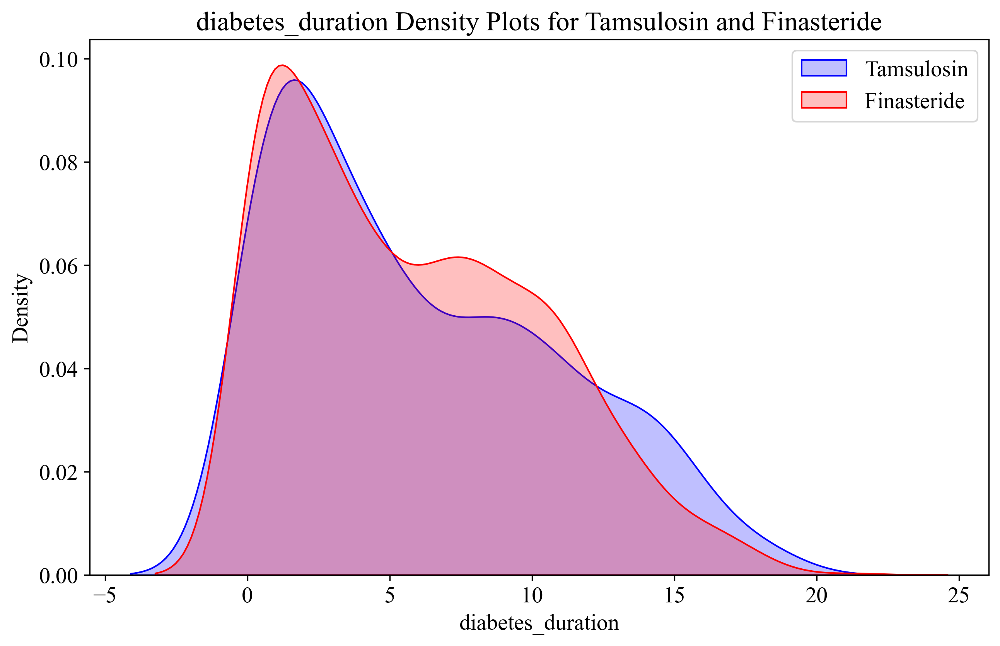

In [208]:
plot_kde(finasteride_df, tamsulosin_df, 'diabetes_duration')

/var/folders/pm/xwg87rb17bvbcqy08ntdr7880000gn/T/ipykernel_60399/318777307.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(tamsulosin, shade=True, color='blue', label='Tamsulosin')
/var/folders/pm/xwg87rb17bvbcqy08ntdr7880000gn/T/ipykernel_60399/318777307.py:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(finasteride, shade=True, color='red', label='Finasteride')


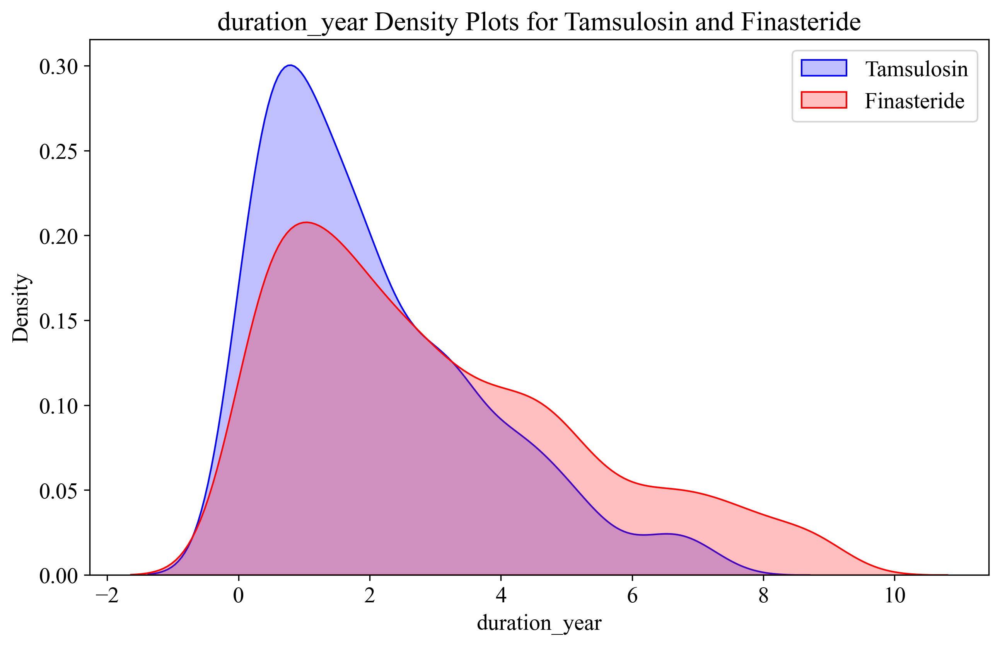

In [209]:
plot_kde(tamsulosin_df, finasteride_df, 'duration_year')

/var/folders/pm/xwg87rb17bvbcqy08ntdr7880000gn/T/ipykernel_60399/318777307.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(tamsulosin, shade=True, color='blue', label='Tamsulosin')
/var/folders/pm/xwg87rb17bvbcqy08ntdr7880000gn/T/ipykernel_60399/318777307.py:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(finasteride, shade=True, color='red', label='Finasteride')


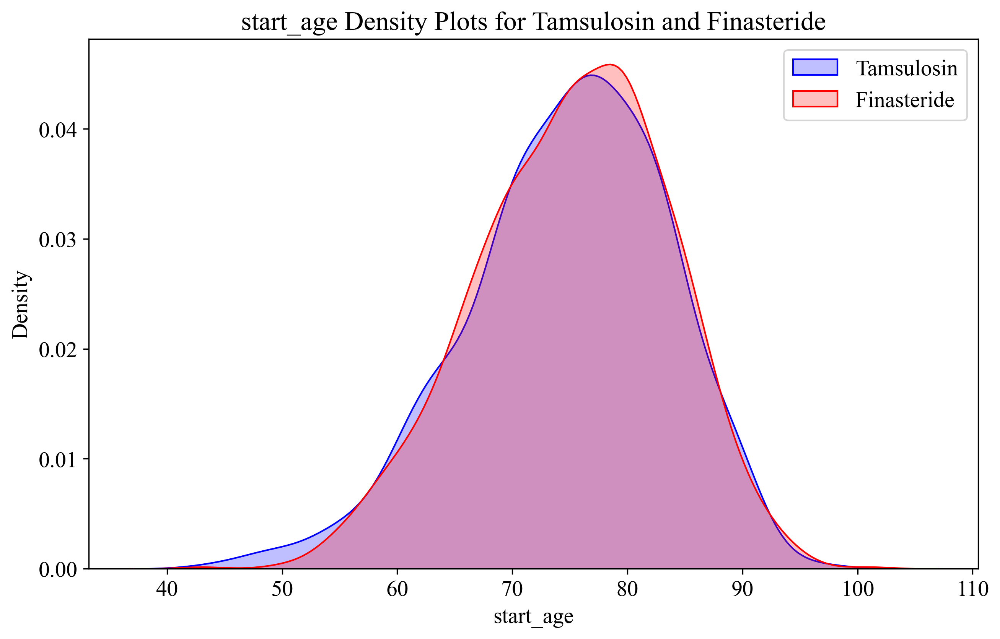

In [210]:
plot_kde(tamsulosin_df, finasteride_df, 'start_age')

/var/folders/pm/xwg87rb17bvbcqy08ntdr7880000gn/T/ipykernel_60399/318777307.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(tamsulosin, shade=True, color='blue', label='Tamsulosin')
/var/folders/pm/xwg87rb17bvbcqy08ntdr7880000gn/T/ipykernel_60399/318777307.py:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(finasteride, shade=True, color='red', label='Finasteride')


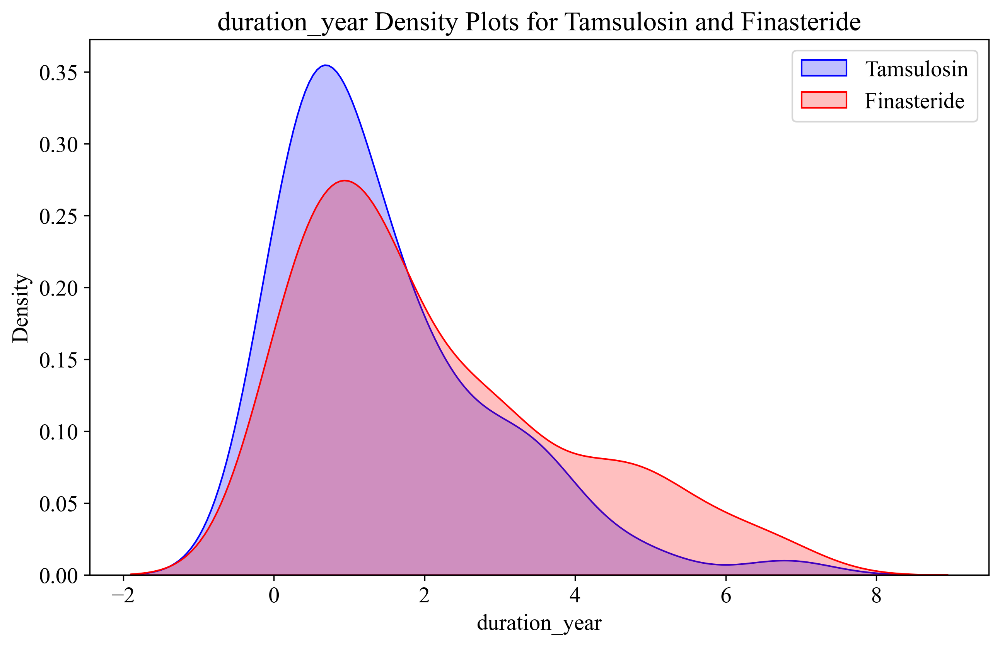

In [211]:
plot_kde(tamsulosin_df.query('insulin_status == 1'), finasteride_df.query('insulin_status == 1'), 'duration_year')

/var/folders/pm/xwg87rb17bvbcqy08ntdr7880000gn/T/ipykernel_60399/318777307.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(tamsulosin, shade=True, color='blue', label='Tamsulosin')
/var/folders/pm/xwg87rb17bvbcqy08ntdr7880000gn/T/ipykernel_60399/318777307.py:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(finasteride, shade=True, color='red', label='Finasteride')


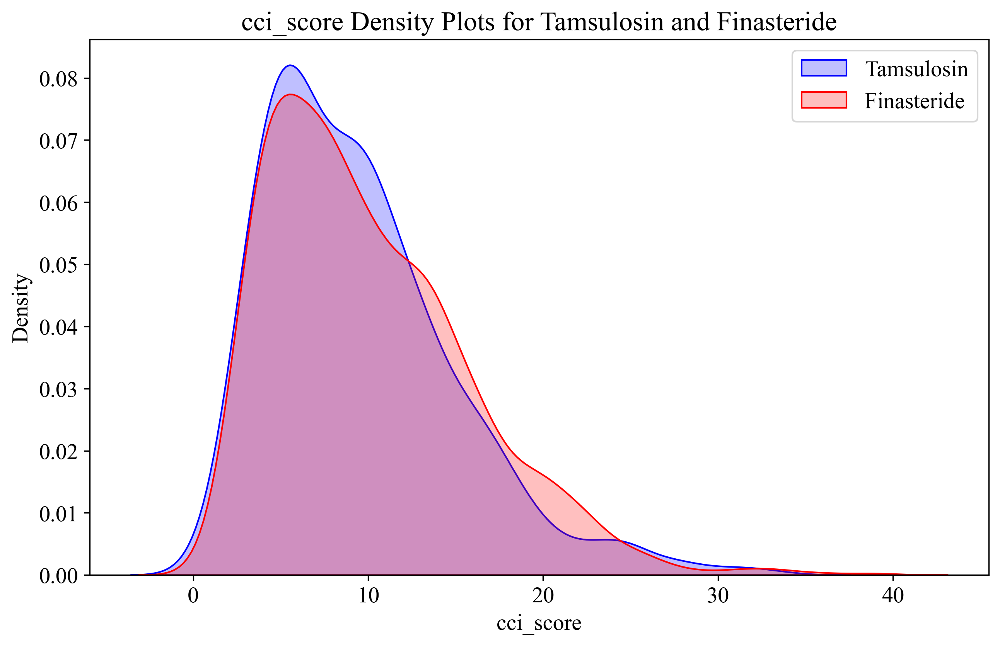

In [212]:
plot_kde(tamsulosin_df, finasteride_df, 'cci_score')

## Multi-variable Cox-proportional hazard model

In [213]:
unadjusted_variables = ['Treatment', 'insulin_status', 'duration_year']

In [214]:
variables = ['Treatment',
       'ACE_inhibitors', 'ARBs' ,'Beta_blocker',   'diuretics', 'statin',
       #'corticosteroid', 
       #'second_hospitalisation', 
       'insulin_status','duration_year',
       'start_age', 'cci_score', 'diabetes_duration',
       'metformin', 'sulfonylureas',
       'ethnicity_Asian', 'ethnicity_Indigenous', 'ethnicity_Not_Stated/Other/Unknown']

In [215]:
from lifelines import CoxPHFitter
from lifelines.statistics import proportional_hazard_test
from scipy.stats import chi2_contingency, f_oneway, kruskal
from scipy.stats import ranksums

def Cox_proportional_model(df1, df2, df1_name, df2_name, variables):
    
    # Merge the two data frames
    df = pd.concat([df1, df2], axis=0)
    # Run the Cox proportional hazard model
    np.random.seed(42)

    cph = CoxPHFitter()
    cph.fit(df[variables],
        duration_col='duration_year', event_col='insulin_status')

    summary_table = cph.summary
    
    treatment_labels = [df1_name, df2_name]
    for i, label in enumerate(treatment_labels):
        mask = (df['Treatment'] == i)
        patients = mask.sum()
        event_count = df[mask]['insulin_status'].sum()
        no_event_count = patients - event_count
        print(f'Treatment {i} ({label}): {patients} patients, {event_count} events, {no_event_count} censored')

    fig, ax = plt.subplots(figsize=(10, 6), dpi = 300)

    # Plot Cox-proportional hazard
    cph.plot_partial_effects_on_outcome('Treatment', [0, 1], cmap='coolwarm', ax=ax)

    # Access the lines and change their colors
    ax.get_lines()[0].set_color('blue')
    ax.get_lines()[1].set_color('red')

    ax.set_xlabel('Duration of following-up (years')
    ax.set_ylabel('Probability of receiving insulin prescription')
    # ax.set_title(f'Survival curves of {df1_name} versus {df2_name}')
    ax.legend(labels=treatment_labels)

    plt.show()

    return summary_table


### Propensity score

In [216]:
from sklearn.linear_model import LogisticRegression

covariates = ['ACE_inhibitors', 'ARBs' ,'Beta_blocker', 'diuretics', 'statin', #medications
             #'corticosteroid',
             #'second_hospitalisation', 
             'metformin', 'sulfonylureas', #T2DMmedications
             'start_age',
             'cci_score', 'diabetes_duration', 
             'ethnicity_Asian', 'ethnicity_Indigenous','ethnicity_Not_Stated/Other/Unknown']

def estimate_propensity_scores(df1, df2):
    # Merge the two dataframes
    df = pd.concat([df1, df2], axis=0)

    # Define the predictors and the outcome variable
    X = df[covariates]
    y = df['Treatment']

    # Estimate propensity scores using logistic regression
    logistic_regression = LogisticRegression(solver='lbfgs', max_iter=1000)
    logistic_regression.fit(X, y)
    df['propensity_score'] = logistic_regression.predict_proba(X)[:, 1]
    # Trimming the weights
    lower_bound, upper_bound = df['propensity_score'].quantile([0.01, 0.99])  # Modify this line according to your chosen percentiles
    df['propensity_score'] = np.where(df['propensity_score'] < lower_bound, lower_bound,
                         np.where(df['propensity_score'] > upper_bound, upper_bound, df['propensity_score']))


    return df

### Kaplan Meier-curve after propensity score weighting

In [217]:
def cumulative_incidence_weighted(df, df1_name, df2_name):
    # fit Kaplan-Meier curves and calculate log-rank p-value
    kmf_tam = KaplanMeierFitter()
    kmf_fin = KaplanMeierFitter()

    #df_1 is finasteride, df_2 is tamsulosin
    df1 = df[df['Treatment'] == 0]
    df2 = df[df['Treatment'] == 1]

    # fit dataframes curves
    kmf_tam.fit(df1['duration_year'], event_observed=df1['insulin_status'], label=df1_name, weights=df1['ipw'])
    kmf_fin.fit(df2['duration_year'], event_observed=df2['insulin_status'], label=df2_name, weights=df2['ipw'])

    # plot Cumulative Incidence curves
    ax2 = (1 - kmf_fin.survival_function_).plot(label=f'{df1_name} (Cumulative Incidence)', color='red', linestyle='--')
    (1 - kmf_tam.survival_function_).plot(ax=ax2, label=f'{df2_name} (Cumulative Incidence)', color='blue', linestyle='-')
    ax2.set_title('Cumulative Incidence Over Time')
    ax2.set_xlabel('Time (years)')
    ax2.set_ylabel('Cumulative Incidence')
    ax2.legend()

    # calculate and print log-rank p-value
    results = logrank_test(df1['duration_year'], df2['duration_year'], df1['insulin_status'], df2['insulin_status'], alpha=.99)
    print('Log-Rank Test p-value:', results.p_value)

### Inverese probability weighting

In [287]:
def cox_ipw_and_graphs(df, df1_control_name,df2_treatment_name):

   # Calculate inverse probability weights
    df['ipw'] = np.where(df['Treatment'] == 1, 1/df['propensity_score'], 1/(1 - df['propensity_score']))

    # Weight trimming at 1st and 99th percentile
    lower_bound = df['ipw'].quantile(0.01)
    upper_bound = df['ipw'].quantile(0.99)
    df['ipw'] = df['ipw'].clip(lower=lower_bound, upper=upper_bound)
    
    #Output summary table
    print(summarize_variables_after_weighted(df,variables, grouped_variables, 'ipw'))
    
    #boxplot for weighted data to check distribution
    plot_box_and_weighted_box(df[df['Treatment'] == 1], df[df['Treatment'] == 0], 'cci_score', 'ipw', 'CCI score')
    plot_box_and_weighted_box(df[df['Treatment'] == 1], df[df['Treatment'] == 0], 'diabetes_duration', 'ipw', 'Diabetes duration')
    plot_box_and_weighted_box(df[df['Treatment'] == 1], df[df['Treatment'] == 0], 'start_age', 'ipw', 'Age')
    
    #plot ecdf for weighted data
    plot_ecdf_and_weighted_ecdf(df[df['Treatment'] == 1], df[df['Treatment'] == 0], 'cci_score', 'ipw', 'CCI score')
    plot_ecdf_and_weighted_ecdf(df[df['Treatment'] == 1], df[df['Treatment'] == 0], 'diabetes_duration', 'ipw', 'Diabetes duration')
    plot_ecdf_and_weighted_ecdf(df[df['Treatment'] == 1], df[df['Treatment'] == 0], 'start_age', 'ipw', 'Age')
    
    # Fit the Cox proportional hazard model with IPW
    cph = CoxPHFitter()
    cph.fit(df[['Treatment', 
                'duration_year','insulin_status', 'ipw']], 
            duration_col='duration_year', event_col='insulin_status', weights_col='ipw',
            robust = True)
    
    #Counting patients in each treatment group
    treatment_labels = [df1_control_name, df2_treatment_name]
    for i, label in enumerate(treatment_labels):
        mask = (df['Treatment'] == i)
        patients = mask.sum()
        event_count = df[mask]['insulin_status'].sum()
        no_event_count = patients - event_count

        # Calculate the weighted event count
        weighted_event_count = (df[mask]['insulin_status'] * df[mask]['ipw']).sum()

        # Calculate the total number of patients in the weighted population
        weighted_patient_count = df[mask]['ipw'].sum()

        print(f'''Treatment {i} ({label}): {patients} patients, {event_count} events, {no_event_count} censored, 
              {round(weighted_event_count,0)} weighted events, {round(weighted_patient_count,0)} total patients in weighted population''')
                    
    
    # Plot Cox-proportional hazard
    fig, ax = plt.subplots(figsize=(10, 6))
    cph.plot_partial_effects_on_outcome('Treatment', [0, 1], cmap='coolwarm', ax=ax)

    ax.set_xlabel('Duration of following-up (years)')
    ax.set_ylabel('Probability of receiving insulin prescriptions')
    # ax.set_title(f'Survival curves of {df1_control_name} versus {df2_treatment_name}')
    ax.legend(labels=[df1_control_name, df2_treatment_name])

    plt.show()

    return cph.summary

In [219]:
def cox_ipw(df, df1_control_name,df2_treatment_name):

   # Calculate inverse probability weights
    df['ipw'] = np.where(df['Treatment'] == 1, 1/df['propensity_score'], 1/(1 - df['propensity_score']))

    # Weight trimming at 1st and 99th percentile
    lower_bound = df['ipw'].quantile(0.01)
    upper_bound = df['ipw'].quantile(0.99)
    df['ipw'] = df['ipw'].clip(lower=lower_bound, upper=upper_bound)
    
    #Output summary table
    print(summarize_variables_after_weighted(df,variables, grouped_variables, 'ipw'))
    
     # Fit the Cox proportional hazard model with IPW
    cph = CoxPHFitter()
    cph.fit(df[['Treatment', 
                'duration_year','insulin_status', 'ipw']], 
            duration_col='duration_year', event_col='insulin_status', weights_col='ipw',
            robust = True)
    
    
    #Counting patients in each treatment group
    treatment_labels = [df1_control_name, df2_treatment_name]
    for i, label in enumerate(treatment_labels):
        mask = (df['Treatment'] == i)
        patients = mask.sum()
        event_count = df[mask]['insulin_status'].sum()
        no_event_count = patients - event_count

        # Calculate the weighted event count
        weighted_event_count = (df[mask]['insulin_status'] * df[mask]['ipw']).sum()

        # Calculate the total number of patients in the weighted population
        weighted_patient_count = df[mask]['ipw'].sum()

        print(f'''Treatment {i} ({label}): {patients} patients, {event_count} events, {no_event_count} censored, 
              {round(weighted_event_count,0)} weighted events, {round(weighted_patient_count,0)} total patients in weighted population''')
                
    
    fig, ax = plt.subplots(figsize=(10, 6), dpi = 300)

    # Plot Cox-proportional hazard
    cph.plot_partial_effects_on_outcome('Treatment', [0, 1], cmap='coolwarm', ax=ax)

    # Access the lines and change their colors
    ax.get_lines()[0].set_color('blue')
    ax.get_lines()[1].set_color('red')

    ax.set_xlabel('Duration of following-up (years)')
    ax.set_ylabel('Probability of receiving insulin prescriptions')
    # ax.set_title(f'Survival curves of {df1_control_name} versus {df2_treatment_name}')
    ax.legend(labels=[df1_control_name, df2_treatment_name])

    plt.show()

    return cph.summary

In [220]:
def cox_ipw_strata(df, df1_control_name,df2_treatment_name):

   # Calculate inverse probability weights
    df['ipw'] = np.where(df['Treatment'] == 1, 1/df['propensity_score'], 1/(1 - df['propensity_score']))

    # Weight trimming at 1st and 99th percentile
    lower_bound = df['ipw'].quantile(0.01)
    upper_bound = df['ipw'].quantile(0.99)
    df['ipw'] = df['ipw'].clip(lower=lower_bound, upper=upper_bound)
    
    #Output summary table
    print(summarize_variables_after_weighted(df,variables, grouped_variables, 'ipw'))
    
    # Fit the Cox proportional hazard model with IPW
    cph = CoxPHFitter()
    cph.fit(df[['Treatment', 
                'duration_year','insulin_status', 'ipw']], 
            duration_col='duration_year', event_col='insulin_status', weights_col='ipw',
            robust = True)
    
    
    #Counting patients in each treatment group
    treatment_labels = [df1_control_name, df2_treatment_name]
    for i, label in enumerate(treatment_labels):
        mask = (df['Treatment'] == i)
        patients = mask.sum()
        event_count = df[mask]['insulin_status'].sum()
        no_event_count = patients - event_count

        # Calculate the weighted event count
        weighted_event_count = (df[mask]['insulin_status'] * df[mask]['ipw']).sum()

        # Calculate the total number of patients in the weighted population
        weighted_patient_count = df[mask]['ipw'].sum()

        print(f'''Treatment {i} ({label}): {patients} patients, {event_count} events, {no_event_count} censored, 
              {round(weighted_event_count,0)} weighted events, {round(weighted_patient_count,0)} total patients in weighted population''')
                
    
    fig, ax = plt.subplots(figsize=(10, 6), dpi = 300)

    # Plot Cox-proportional hazard
    cph.plot_partial_effects_on_outcome('Treatment', [0, 1], cmap='coolwarm', ax=ax)

    # Access the lines and change their colors
    ax.get_lines()[0].set_color('blue')
    ax.get_lines()[1].set_color('red')

    ax.set_xlabel('Duration of following-up (years)')
    ax.set_ylabel('Probability of receiving insulin prescriptions')
    # ax.set_title(f'Survival curves of {df1_control_name} versus {df2_treatment_name}')
    ax.legend(labels=[df1_control_name, df2_treatment_name])

    plt.show()

    return cph.summary

In [222]:
def check_assumption_cox(df1, df2, df1_name, df2_name, variables):
    
    # Merge the two data frames
    df = pd.concat([df1, df2], axis=0)
    # Run the Cox proportional hazard model
    np.random.seed(42)

    cph = CoxPHFitter()
    cph.fit(df[variables],
        duration_col='duration_year', event_col='insulin_status')

    summary_table = cph.summary

    # Check the proportional hazard assumption
    df_check_assumption = df.drop('new_enc_nhi', axis=1)
    df_check_assumption= df_check_assumption.reset_index(drop=True)
    # Check the proportional hazards assumption
    # Select only the columns you're interested in
    columns_of_interest = variables
    df_subset = df_check_assumption[columns_of_interest].copy()
    cph.check_assumptions(df_subset, p_value_threshold=0.05, show_plots=True, 
                       )
        # Print the summary table
    treatment_labels = [df1_name, df2_name]
    for i, label in enumerate(treatment_labels):
        mask = (df['Treatment'] == i)
        patients = mask.sum()
        event_count = df[mask]['insulin_status'].sum()
        no_event_count = patients - event_count
        print(f'Treatment {i} ({label}): {patients} patients, {event_count} events, {no_event_count} censored')

    fig, ax = plt.subplots(figsize=(10, 6))

    cph.plot_partial_effects_on_outcome('Treatment', [0, 1], cmap='coolwarm', ax=ax)

    ax.set_xlabel('Duration (years)')
    ax.set_ylabel('Survival probability')
    ax.set_title(f'Survival curves of {df1_name} versus {df2_name}')
    ax.legend(labels=treatment_labels)

    plt.show()

    return summary_table

### Stratification by cci score

In [223]:
variables_strata_cci = ['Treatment',
       'ACE_inhibitors', 'ARBs' ,'Beta_blocker',   'diuretics', 'statin',
       #'corticosteroid', 
       #'second_hospitalisation', 
       'metformin', 'sulfonylureas',
       'insulin_status','duration_year',
       'start_age', #'cci_score', 
       'diabetes_duration',
       'ethnicity_Asian', 'ethnicity_Indigenous', 'ethnicity_Not_Stated/Other/Unknown']
#percentile strata
def run_cox_models_percentile_strata(df1, df2, df1_name, df2_name):
    # Merge the two dataframes
    aggregate_df = pd.concat([df1, df2], axis=0)

    # Calculate the percentile values for cci_score
    median_cci = aggregate_df['cci_score'].quantile(0.5)
    tertile_1_cci = aggregate_df['cci_score'].quantile(1/3)
    tertile_2_cci = aggregate_df['cci_score'].quantile(2/3)

    print(f"Median CCI score: {median_cci:.2f}")

    # Define the strata based on cci_score percentiles
    strata = {
        'scenario_1': {
            'lower': (0, median_cci),
            'higher': (median_cci, np.inf)
        },
        # 'scenario_2': {
        #     'tertile_1': (0, tertile_1_cci),
        #     'tertile_2': (tertile_1_cci, tertile_2_cci),
        #     'tertile_3': (tertile_2_cci, np.inf)
        # }
    }

    # Loop through the scenarios and strata and run the Cox proportional hazard model for each stratum
    for scenario, strata_ranges in strata.items():
        print(f"{scenario.capitalize()}:")
            # add this before your loop
        all_summary_tables = []
        for stratum_name, cci_range in strata_ranges.items():
            print(f"{stratum_name.capitalize()} stratum:")

            # Filter the DataFrames based on the cci_score range for the current stratum
            filtered_df1 = df1.loc[(df1['cci_score'] > cci_range[0]) & (df1['cci_score'] <= cci_range[1])]
            filtered_df2 = df2.loc[(df2['cci_score'] > cci_range[0]) & (df2['cci_score'] <= cci_range[1])]

            #calculate propensity score for each stratum
            total_filtered_df_propensity_score = estimate_propensity_scores(filtered_df1, filtered_df2)

            # Run the Cox proportional hazard model for the filtered DataFrames
            test_table_name = f"{stratum_name.capitalize()} Stratum ({scenario}) - {df1_name} vs {df2_name}"
            summary_table = cox_ipw_strata(total_filtered_df_propensity_score, df1_name, df2_name)
            
            all_summary_tables.append(summary_table)
            
    # add this at the end of your function
    return all_summary_tables

## Primary analysis

Log-Rank Test p-value: 0.06837272776147701

Summary Table:
  Treatment Group  Insulin Status 0  Insulin Status 1   p-value
0     Finasteride              1105               154  0.068373
1      Tamsulosin               513                67          


 Year  Finasteride Number at risk  Tamsulosin Number at risk
    1                        1204                        540
    2                        1149                        516
    3                        1106                        496
    4                        1078                        461
    5                        1022                        454
    6                         992                        442
    7                         940                        378
    8                         940                        378
    9                         940                        378

Cumulative Incidence:
 Year  Finasteride Cumulative Incidence  Tamsulosin Cumulative Incidence
    1                          0.043620  

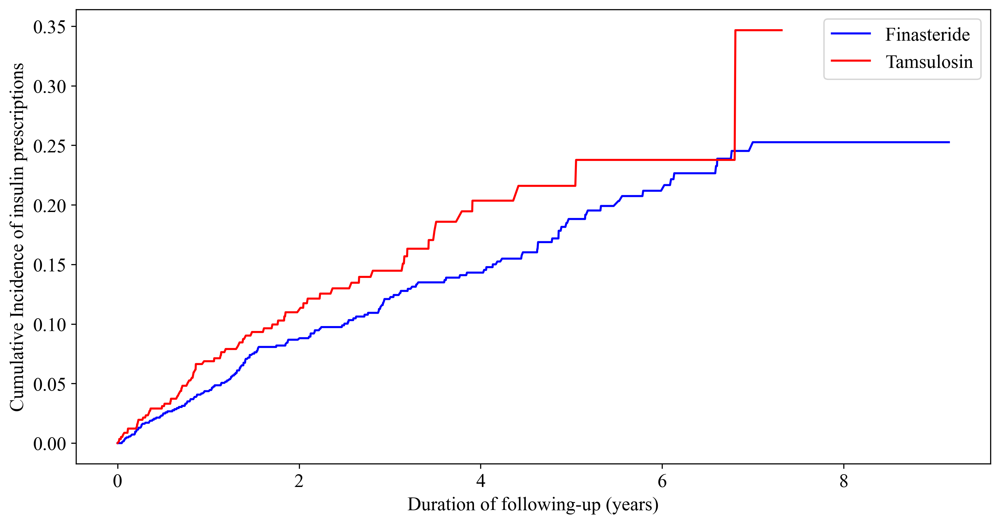

In [224]:
#Kaplan Meier
cumulative_incidence_and_km_plot(finasteride_df,tamsulosin_df, 'Finasteride','Tamsulosin','Cumulative Incidence')


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produc

<lifelines.StatisticalResult: proportional_hazard_test>
 null_distribution = chi squared
degrees_of_freedom = 1
             model = <lifelines.CoxPHFitter: fitted with 1839 total observations, 1618 right-censored observations>
         test_name = proportional_hazard_test

---
                                         test_statistic    p  -log2(p)
ACE_inhibitors                     km              0.14 0.71      0.50
                                   rank            0.20 0.65      0.61
ARBs                               km              0.02 0.89      0.17
                                   rank            0.07 0.79      0.35
Beta_blocker                       km              1.51 0.22      2.19
                                   rank            0.96 0.33      1.61
Treatment                          km              0.18 0.67      0.57
                                   rank            0.23 0.63      0.67
cci_score                          km              0.03 0.87      0.21
                                   rank            0.35 0.55      0.85
diabetes_duration                  km              0.12 0.73      0.46
                                   rank            0.44 0.51      0.98
diuretics                          km              0.01 0.91      0.13
                                   rank            0.00 0.97      0.05
ethnicity_Asian                    km              0.55 0.46      1.12
                                   rank            0.09 0.77      0.38
ethnicity_Indigenous               km              0.01 0.94      0.09
                                   rank            0.02 0.89      0.17
ethnicity_Not_Stated/Other/Unknown km              0.87 0.35      1.51
                                   rank            1.35 0.24      2.03
metformin                          km              2.58 0.11      3.21
                                   rank            5.19 0.02      5.46
start_age                          km              2.36 0.12      3.01
                                   rank            2.90 0.09      3.50
statin                             km              1.29 0.26      1.96
                                   rank            1.55 0.21      2.23
sulfonylureas                      km              1.49 0.22      2.17
                                   rank            0.86 0.35      1.49



1. Variable 'metformin' failed the non-proportional test: p-value is 0.0227.

   Advice: with so few unique values (only 2), you can include `strata=['metformin', ...]` in the
call in `.fit`. See documentation in link [E] below.

   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


---
[A]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html
[B]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html#Bin-variable-and-stratify-on-it
[C]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html#Introduce-time-varying-covariates
[D]  https://lifelines.readthedocs.io/en/latest/jupyter_notebooks/Proportional%20hazard%20assumption.html#Modify-the-functional-form
[E]  https://lifelines.readthed

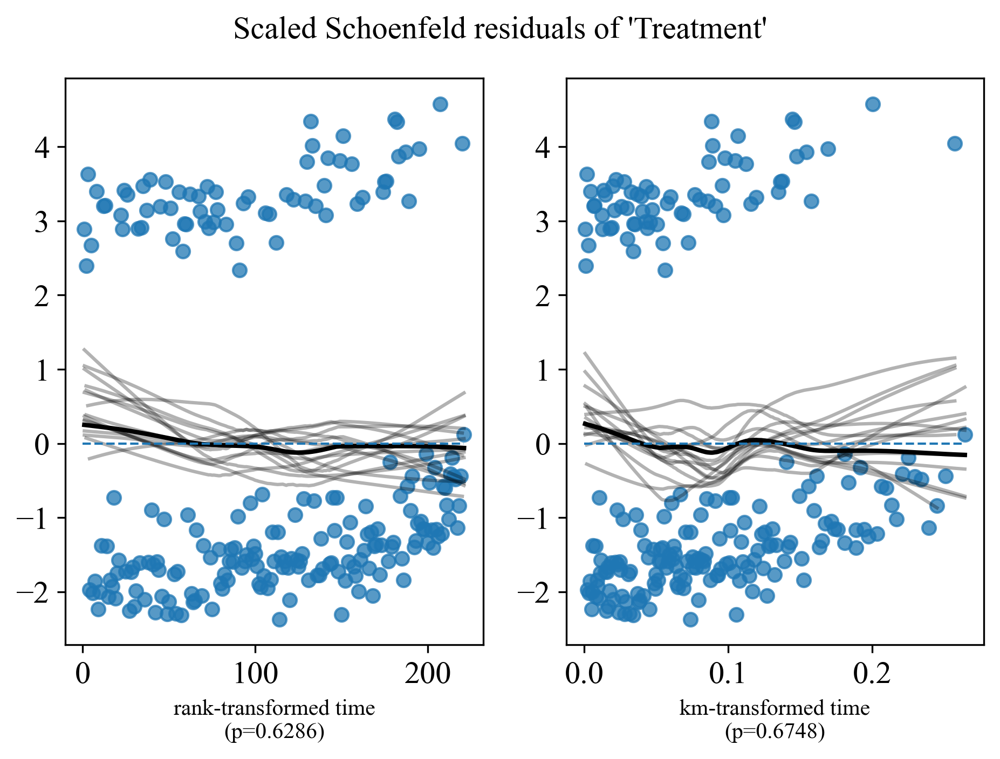

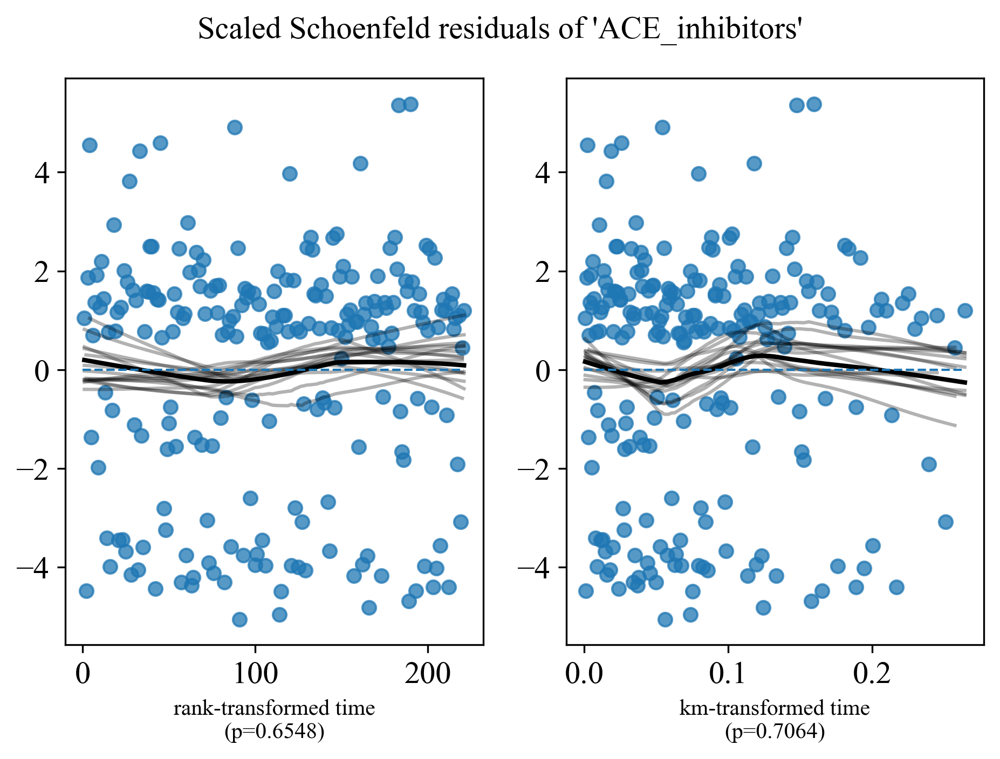

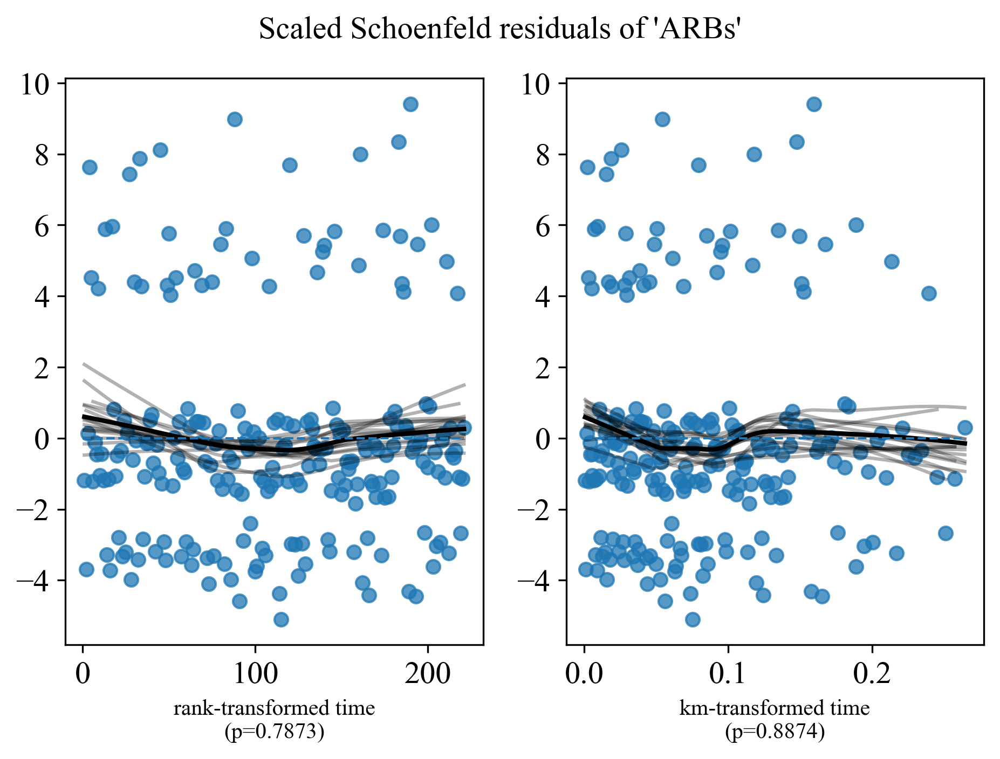

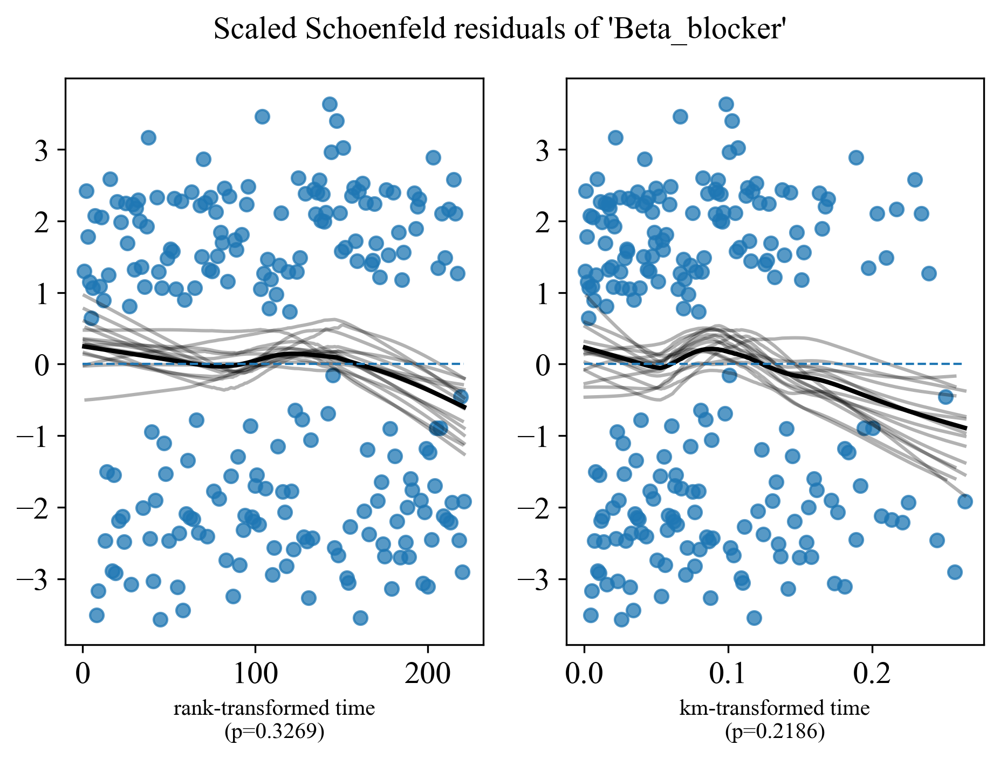

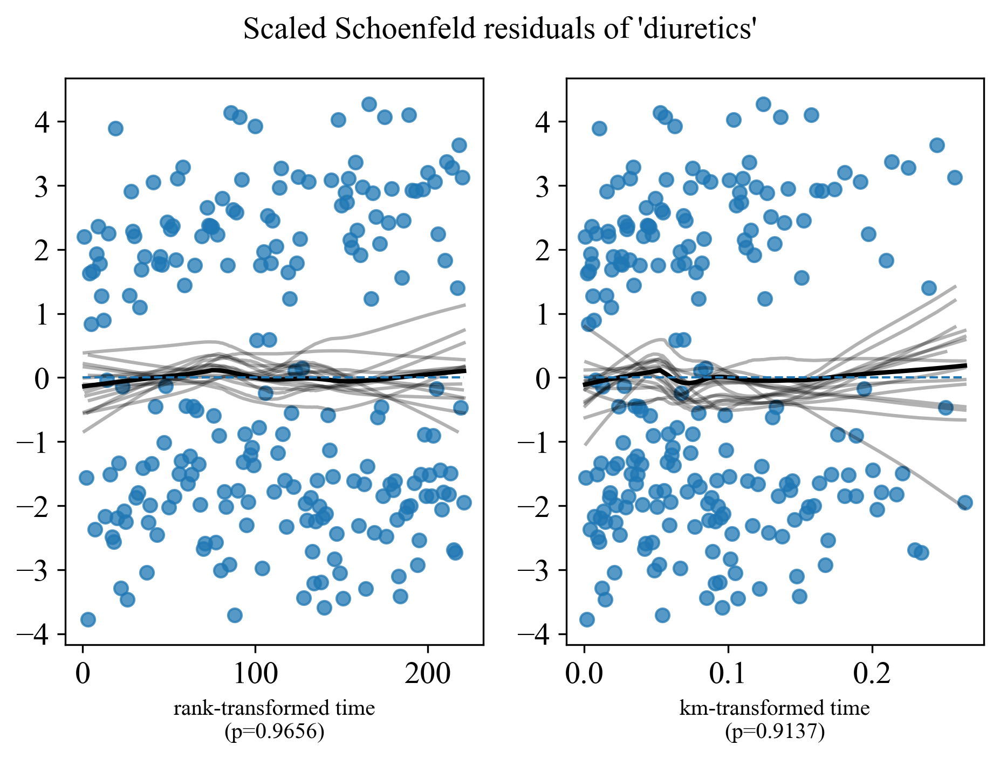

...

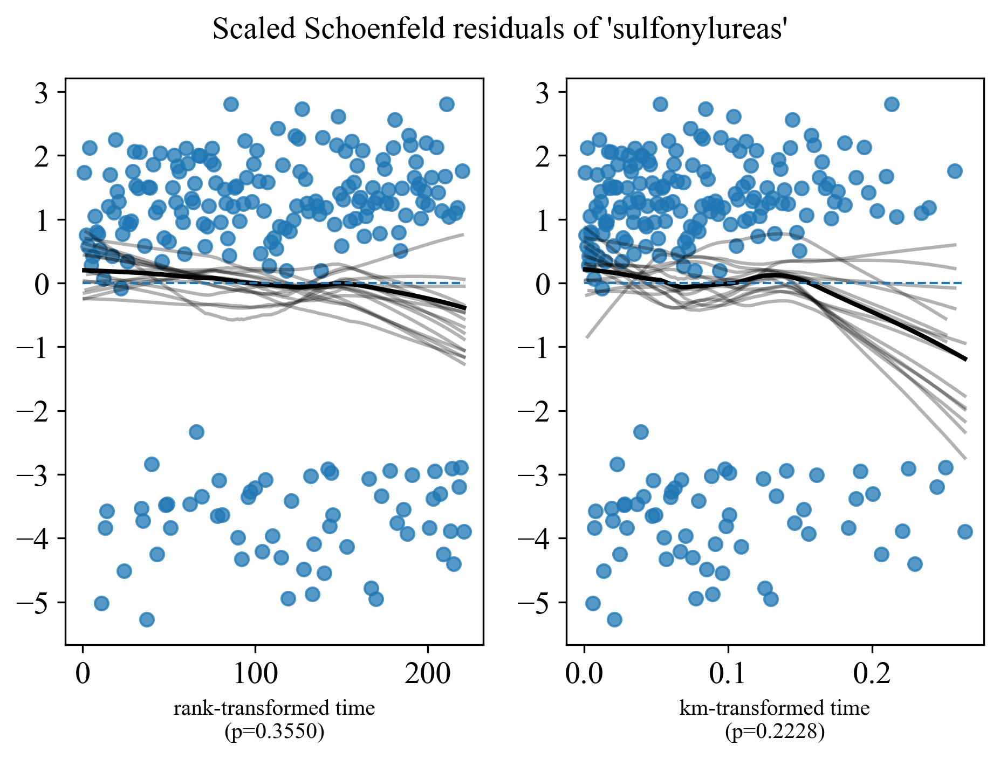

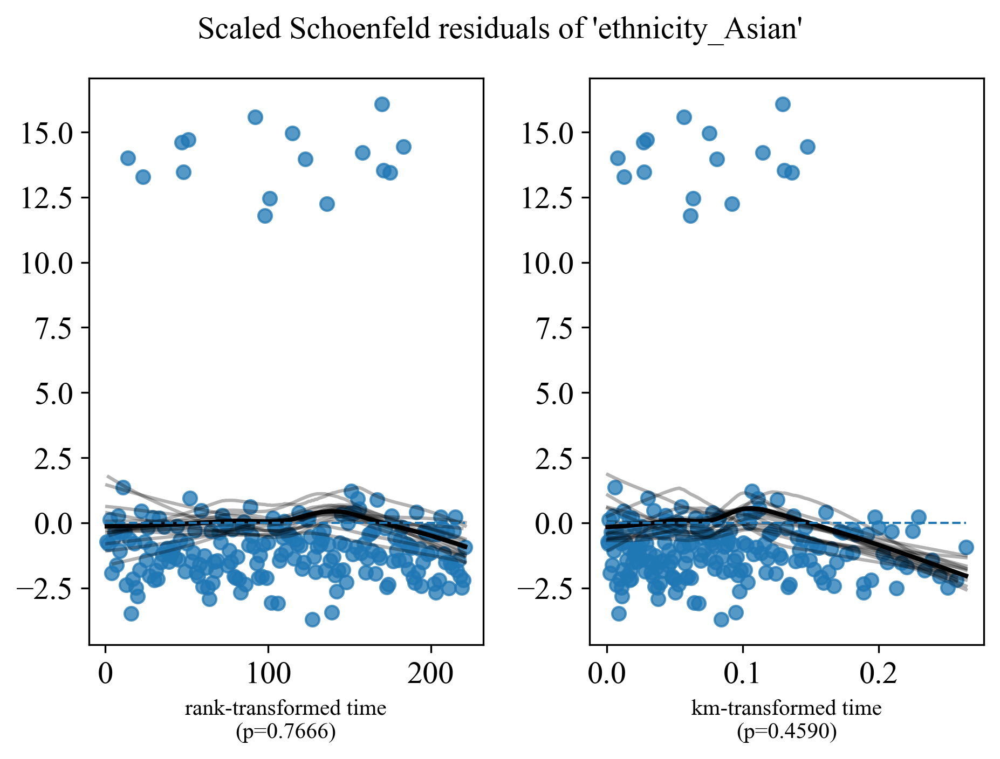

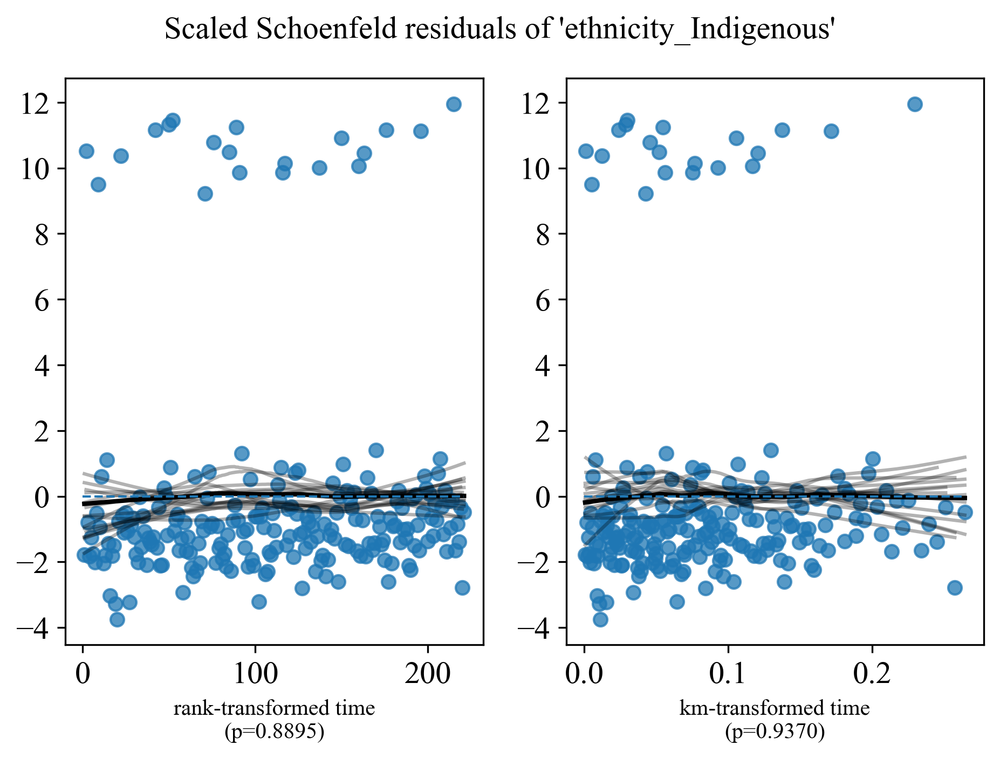

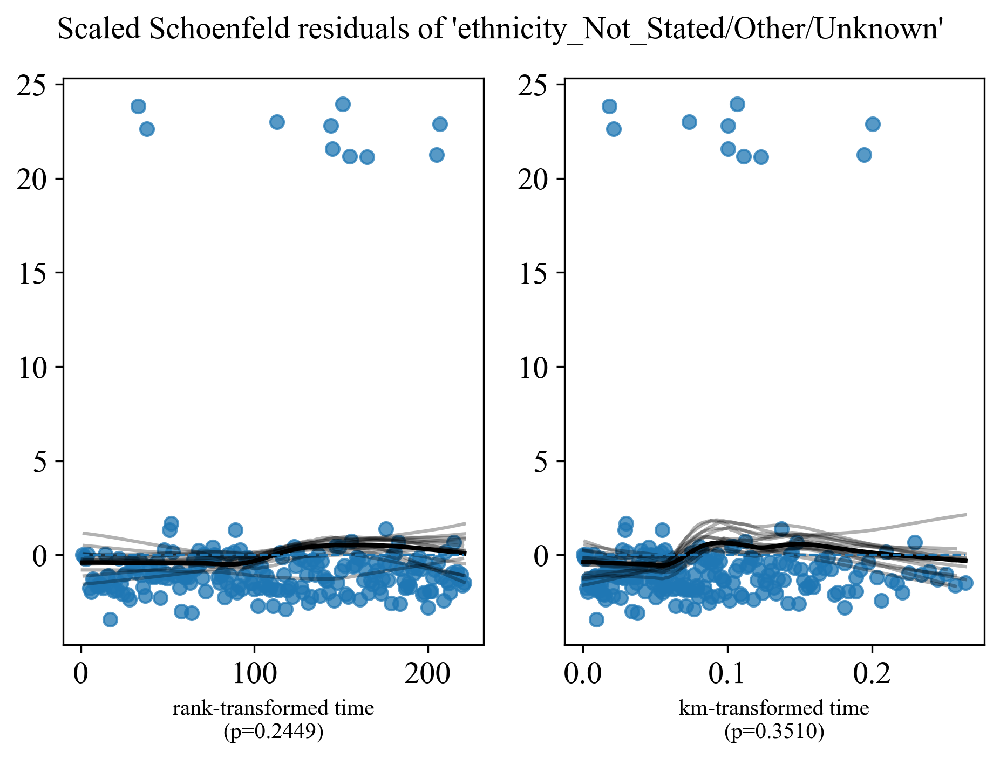

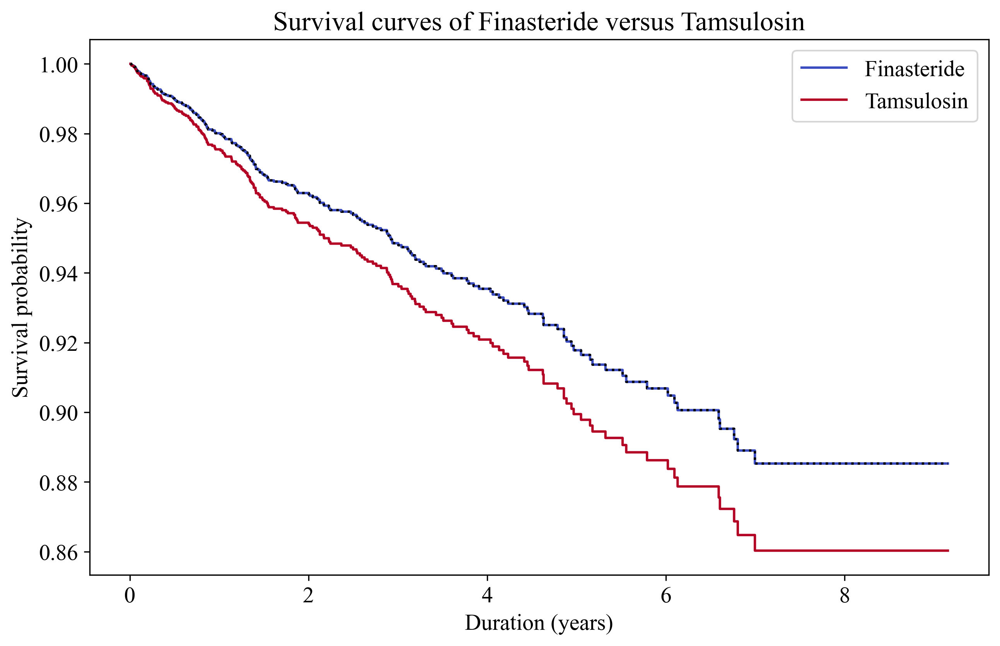

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.211169,1.235121,0.149762,-0.082360,0.504697,0.920941,1.656484,0.0,1.410028,1.585314e-01,2.657159
ACE_inhibitors,-0.308599,0.734475,0.160670,-0.623507,0.006309,0.536061,1.006329,0.0,-1.920696,5.477002e-02,4.190470
ARBs,-0.055014,0.946472,0.200380,-0.447752,0.337724,0.639063,1.401754,0.0,-0.274548,7.836633e-01,0.351694
Beta_blocker,0.047945,1.049113,0.142392,-0.231138,0.327028,0.793630,1.386841,0.0,0.336714,7.363329e-01,0.441570
diuretics,0.111915,1.118418,0.147309,-0.176806,0.400635,0.837943,1.492773,0.0,0.759728,4.474173e-01,1.160307
statin,-0.129610,0.878438,0.191173,-0.504303,0.245083,0.603926,1.277727,0.0,-0.677971,4.977902e-01,1.006390
start_age,-0.048175,0.952967,0.009174,-0.066156,-0.030194,0.935984,0.970258,0.0,-5.251067,1.512209e-07,22.656839
cci_score,0.054909,1.056445,0.011223,0.032913,0.076906,1.033460,1.079940,0.0,4.892568,9.952866e-07,19.938385
diabetes_duration,0.020463,1.020674,0.016152,-0.011193,0.052120,0.988869,1.053502,0.0,1.266950,2.051732e-01,2.285086


In [225]:
check_assumption_cox(finasteride_df, tamsulosin_df, 'Finasteride', 'Tamsulosin', variables)

<Axes: >

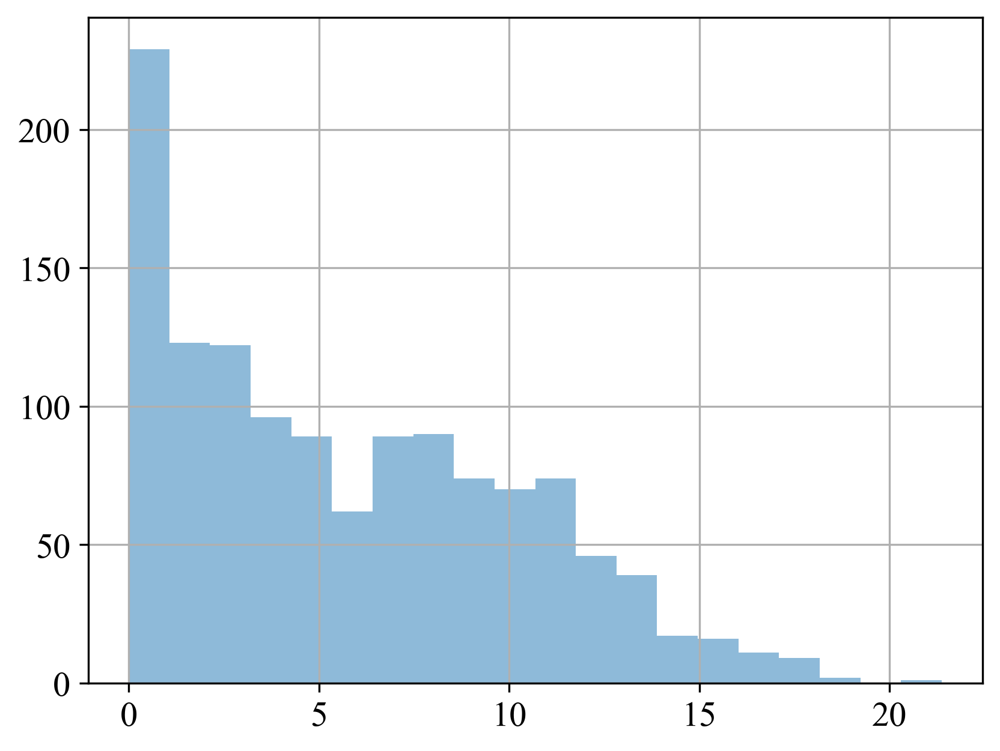

In [226]:
#diabetes duration visualisation
finasteride_df['diabetes_duration'].hist(bins=20, alpha=0.5, label='Finasteride')

<Axes: >

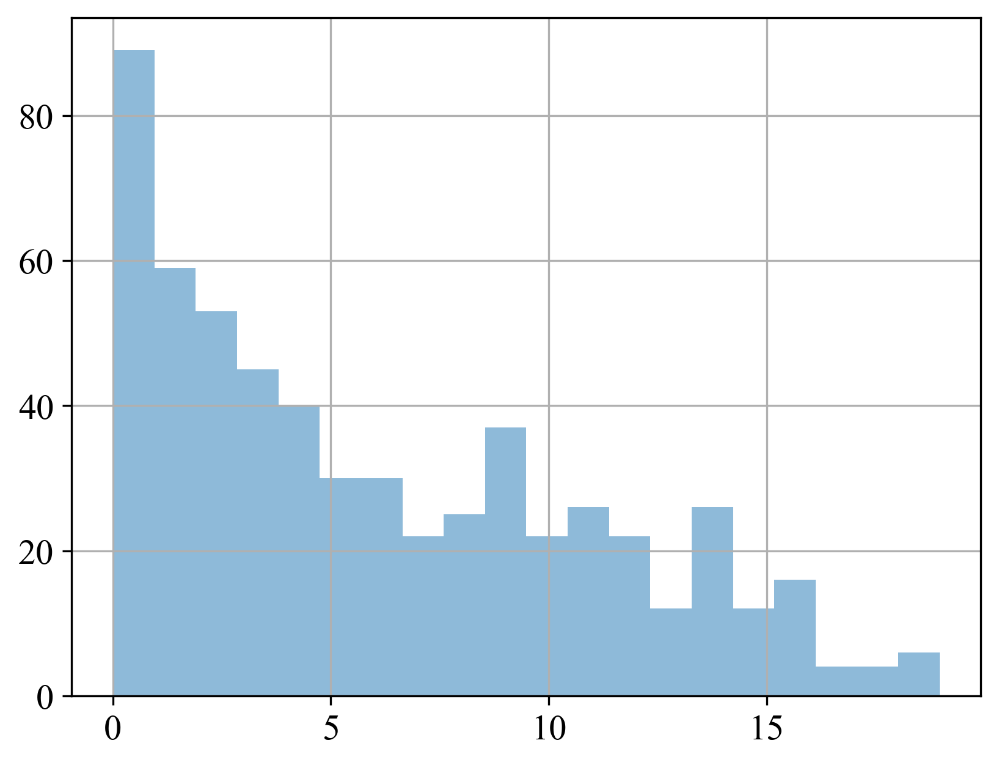

In [227]:
tamsulosin['diabetes_duration'].hist(bins=20, alpha=0.5, label='Tamsulosin')

#### Unadjusted Cox model

Treatment 0 (Finasteride_unadjusted): 1259 patients, 154 events, 1105 censored
Treatment 1 (Tamsulosin_unadjusted): 580 patients, 67 events, 513 censored


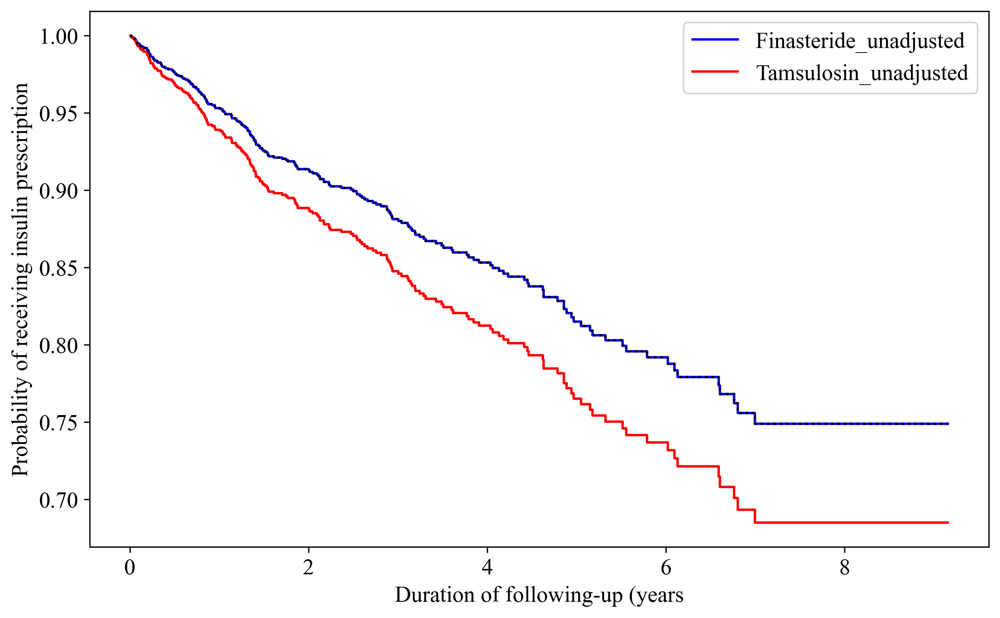

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.269049,1.308719,0.148075,-0.021173,0.55927,0.97905,1.749396,0.0,1.816976,0.069221,3.85265


In [228]:
Cox_proportional_model(tamsulosin_df, finasteride_df, 'Finasteride_unadjusted', 'Tamsulosin_unadjusted', unadjusted_variables)

### Adjusted Hazard ratio

Treatment 0 (Finasteride): 1259 patients, 154 events, 1105 censored
Treatment 1 (Tamsulosin): 580 patients, 67 events, 513 censored


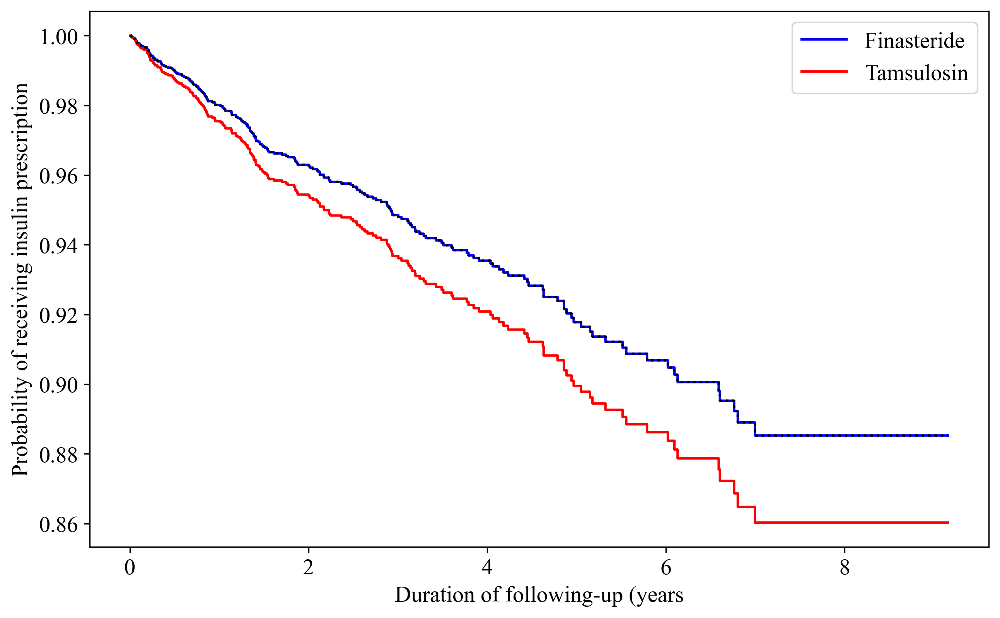

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.211169,1.235121,0.149762,-0.082360,0.504697,0.920941,1.656484,0.0,1.410028,1.585314e-01,2.657159
ACE_inhibitors,-0.308599,0.734475,0.160670,-0.623507,0.006309,0.536061,1.006329,0.0,-1.920696,5.477002e-02,4.190470
ARBs,-0.055014,0.946472,0.200380,-0.447752,0.337724,0.639063,1.401754,0.0,-0.274548,7.836633e-01,0.351694
Beta_blocker,0.047945,1.049113,0.142392,-0.231138,0.327028,0.793630,1.386841,0.0,0.336714,7.363329e-01,0.441570
diuretics,0.111915,1.118418,0.147309,-0.176806,0.400635,0.837943,1.492773,0.0,0.759728,4.474173e-01,1.160307
statin,-0.129610,0.878438,0.191173,-0.504303,0.245083,0.603926,1.277727,0.0,-0.677971,4.977902e-01,1.006390
start_age,-0.048175,0.952967,0.009174,-0.066156,-0.030194,0.935984,0.970258,0.0,-5.251067,1.512209e-07,22.656839
cci_score,0.054909,1.056445,0.011223,0.032913,0.076906,1.033460,1.079940,0.0,4.892568,9.952866e-07,19.938385
diabetes_duration,0.020463,1.020674,0.016152,-0.011193,0.052120,0.988869,1.053502,0.0,1.266950,2.051732e-01,2.285086


In [229]:
Cox_proportional_model(tamsulosin_df, finasteride_df, 'Finasteride', 'Tamsulosin', variables)

### IPTW of primary analysis

In [230]:
summarize_variables_before_weighted(fin_tam_df, variables, grouped_variables)

,Variable,Tamsulosin,Finasteride,Std Difference
0,Number of Patients,580,1259,NaN
1,start_age,74.77 (8.69),75.24 (8.29),0.055
2,duration_year,2.05 (1.66),2.99 (2.30),0.470
3,cci_score,9.50 (5.46),10.05 (5.75),0.099
4,diabetes_duration,6.08 (4.89),5.78 (4.51),0.063
5,metformin,472 (81.38%),1003 (79.67%),0.043
6,sulfonylureas,274 (47.24%),567 (45.04%),0.044
7,ACE_inhibitors,360 (62.07%),852 (67.67%),0.118
8,ARBs,109 (18.79%),186 (14.77%),0.108
9,Beta_blocker,310 (53.45%),634 (50.36%),0.062


In [231]:
#calculate the median of tamsulosin and finasteride duration_year variable
print(f"Median of duration of finasteride is {finasteride_df['duration_year'].median()}")
print(f"Median of duration of tamsulosin is {tamsulosin['duration_year'].median()}") 

Median of duration of finasteride is 2.4421629021218343
Median of duration of tamsulosin is 1.6153319644079398


In [299]:
#propensity score for primary analysis
propensity_score_primary_df = estimate_propensity_scores(tamsulosin_df, finasteride_df)

In [298]:
propensity_score_primary_df

,new_enc_nhi,QUANTITY_DISPENSED,DATE_DISPENSED,QUANTITY_DISPENSED_insulin,DATE_DISPENSED_insulin,Age_diagnosis,Gender,ethnicity,diagnosis,diabetes_date,second_hospitalisation_date,birth_year,DOD,AGE_AT_DEATH_YRS,start_age,insulin_status,end_date,duration_year,cci_score,diabetes_duration,Treatment,ACE_inhibitors,ARBs,Beta_blocker,corticosteroid,diuretics,statin,metformin,sulfonylureas,acarbose,GLP_1,DPP_4,SGLT_2,year,is_dead,ethnicity_grouped,ethnicity_Asian,ethnicity_European,ethnicity_Indigenous,ethnicity_Not_Stated/Other/Unknown,propensity_score,ipw
0,.lKK9SMNP3w,646.0,2010-09-01,NaN,NaN,61,1,11,"L0310, I209, R251, E1160, I10, E669, E785, F10...",2001-04-27,2006-08-24,1940,2015-09-13,75.0,70,0,2015-09-13,5.032170,10,9.347023,1,0,0,1,0,1,1,1,1,0,0,0,0,2010,1,European,0,1,0,0,0.429327,2.329225
1,da8UZgr55Lt,1596.0,2010-09-06,NaN,NaN,79,1,11,"K4090, E1190, I10, M171, E871, E1160",2003-10-21,2011-11-15,1924,2015-02-16,90.0,86,0,2015-02-16,4.446270,6,6.877481,1,1,1,1,0,0,1,0,0,0,0,0,0,2010,1,European,0,1,0,0,0.310325,3.222424
2,i9qWZQVnII.,2695.0,2010-09-07,NaN,NaN,63,1,21,"J440, J969, E86, E1120, E1170, E1160, N179, N1...",2001-10-15,2003-03-25,1938,NaN,NaN,72,0,2017-12-31,7.315537,17,8.895277,1,1,0,1,0,1,1,1,1,0,0,0,0,2010,0,Indigenous,0,0,1,0,0.378573,2.641498
3,YH55h7BGflT,2040.0,2010-09-22,80.0,2014-02-25,77,1,11,"Z466, E1190, Z8643, R33, Z922, N40, A402, N390...",2010-08-30,2013-11-17,1933,NaN,NaN,77,1,2014-02-25,3.427789,9,0.062971,1,1,0,0,0,0,0,1,1,0,0,0,0,2010,0,European,0,1,0,0,0.222809,4.488150
4,lh9FP7T798f,420.0,2010-10-18,NaN,NaN,65,1,11,"I48, I472, I500, E877, E1160, R05, K30, M171, ...",2002-03-04,2012-05-15,1937,2013-02-02,76.0,73,0,2013-02-02,2.294319,14,8.624230,1,1,0,1,0,1,1,1,1,0,0,0,0,2010,1,European,0,1,0,0,0.338450,2.954644
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254,IXWGdV7e.9y,90.0,2017-12-06,NaN,NaN,75,1,32,"R91, E1190, Z8643, J90, R33, C341",2016-08-15,2017-10-15,1941,NaN,NaN,76,0,2017-12-31,0.068446,6,1.308693,0,1,0,0,0,1,1,1,0,0,0,0,0,2017,0,Not_Stated/Other/Unknown,0,0,0,1,0.290904,1.410247
1255,h4Wrl53dBJG,90.0,2017-12-14,NaN,NaN,66,1,54,"H024, E1190, Z8643, I214, I10, E1160, E785, I2...",2001-06-29,2001-07-29,1935,NaN,NaN,82,0,2017-12-31,0.046543,9,16.459959,0,0,1,1,0,0,1,1,0,0,0,0,0,2017,0,Not_Stated/Other/Unknown,0,0,0,1,0.380899,1.615246
1256,m471960ZG/z,90.0,2017-12-20,NaN,NaN,69,1,11,"K566, K660, I10, E1160",2011-06-20,NaN,1942,NaN,NaN,75,0,2017-12-31,0.030116,3,6.502396,0,1,0,0,0,0,0,1,0,0,0,0,0,2017,0,European,0,1,0,0,0.255130,1.342517
1257,.B/RZ1X88id,90.0,2017-12-28,NaN,NaN,74,1,31,"H251, E1130, Z8643",2017-10-24,NaN,1943,NaN,NaN,74,0,2017-12-31,0.008214,5,0.177960,0,1,0,0,0,0,1,1,0,0,0,0,0,2017,0,Indigenous,0,0,1,0,0.323014,1.477135


### Check assumption IPTW

In [300]:
def check_assumption_IPTW(df, df1_name, df2_name, variables):
    # Calculate inverse probability weights
    df['ipw'] = np.where(df['Treatment'] == 1, 1/df['propensity_score'], 1/(1 - df['propensity_score']))

    # Weight trimming at 1st and 99th percentile
    lower_bound = df['ipw'].quantile(0.01)
    upper_bound = df['ipw'].quantile(0.99)
    df['ipw'] = df['ipw'].clip(lower=lower_bound, upper=upper_bound)
    
    cph = CoxPHFitter()
    cph.fit(df[variables],
        duration_col='duration_year', event_col='insulin_status', weights_col='ipw')

    summary_table = cph.summary

    # Check the proportional hazard assumption
    df_check_assumption = df.drop('new_enc_nhi', axis=1)
    df_check_assumption= df_check_assumption.reset_index(drop=True)
    # Check the proportional hazards assumption
    # Select only the columns you're interested in
    columns_of_interest = variables
    df_subset = df_check_assumption[columns_of_interest].copy()
    cph.check_assumptions(df_subset, p_value_threshold=0.05, show_plots=True, 
                       )

    return summary_table

In [ ]:
check_assumption_IPTW(propensity_score_primary_df, 'Finasteride', 'Tamsulosin', variables)

                                  Variable     Tamsulosin    Finasteride  \
0                       Number of Patients            580           1259   
1                                start_age   75.08 (8.63)   75.10 (8.30)   
2                            duration_year    2.08 (1.66)    2.97 (2.29)   
3                                cci_score    9.87 (5.66)    9.89 (5.66)   
4                        diabetes_duration    5.83 (4.83)    5.87 (4.53)   
5                                metformin  1476 (80.40%)  1473 (80.20%)   
6                            sulfonylureas   837 (45.58%)   838 (45.63%)   
7                           ACE_inhibitors  1213 (66.07%)  1213 (66.03%)   
8                                     ARBs   296 (16.13%)   294 (16.00%)   
9                             Beta_blocker   947 (51.58%)   943 (51.32%)   
10                               diuretics   709 (38.62%)   715 (38.90%)   
11                                  statin  1524 (83.03%)  1521 (82.79%)   
12          

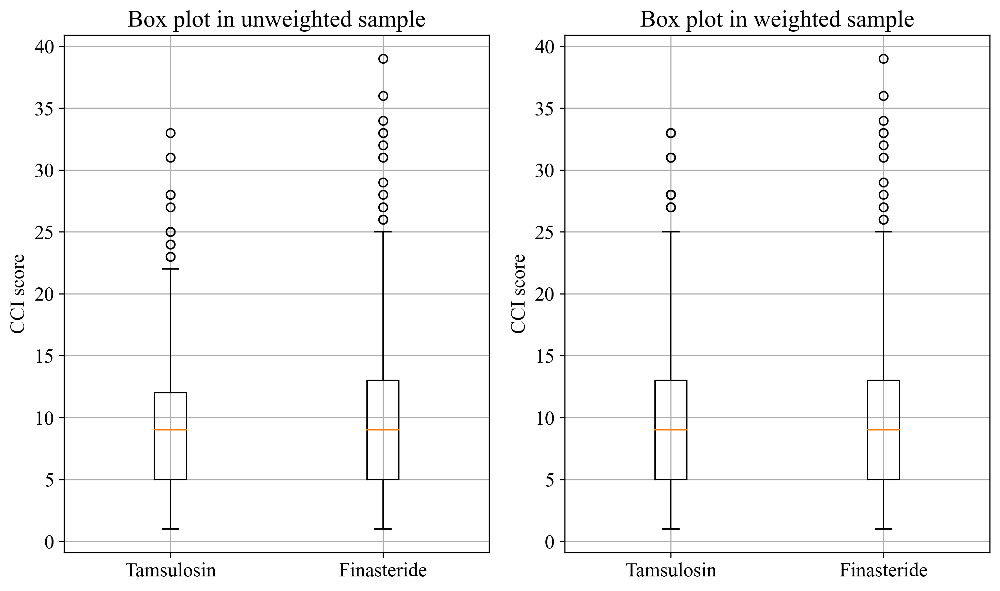

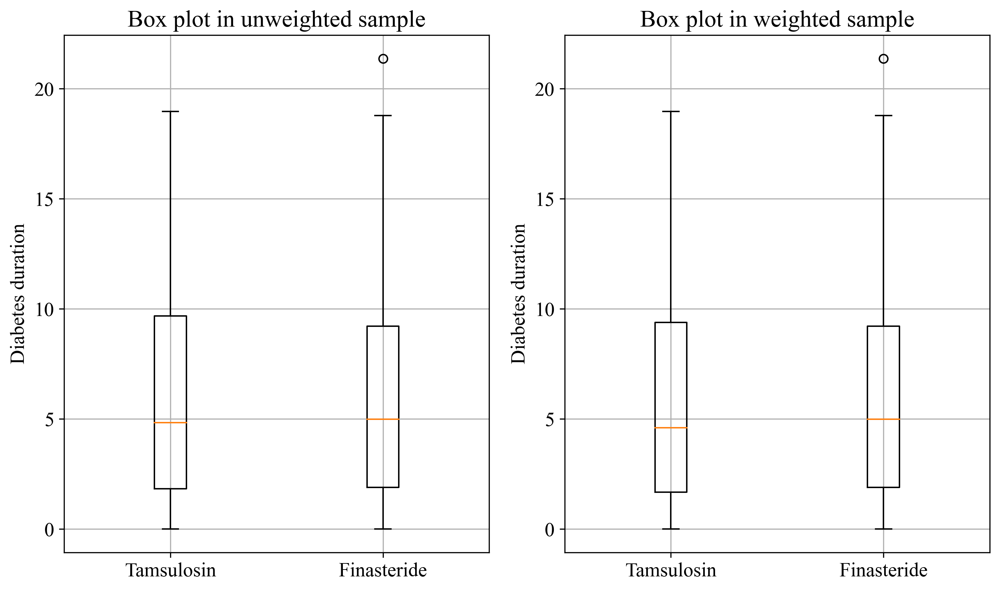

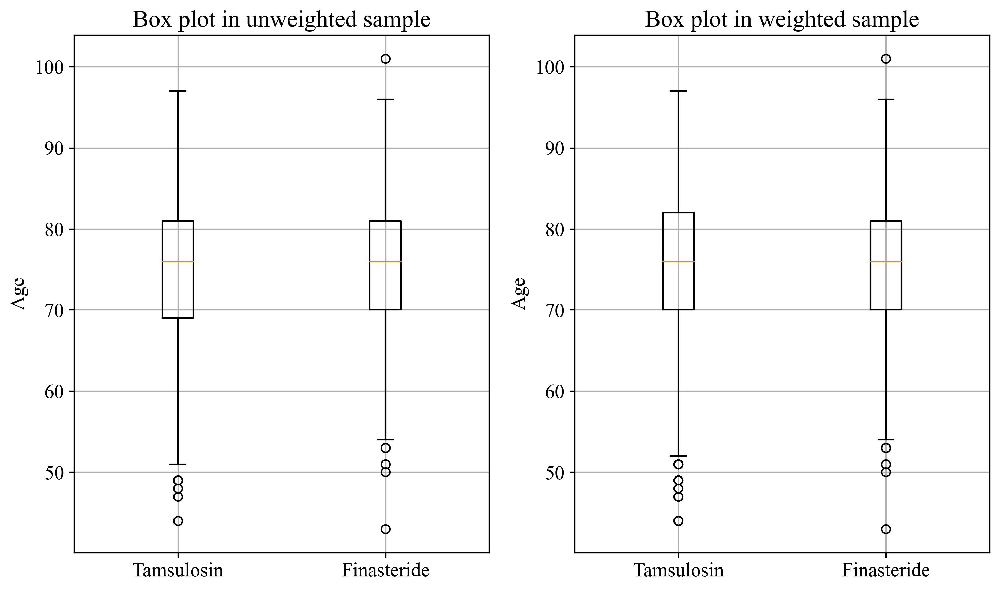

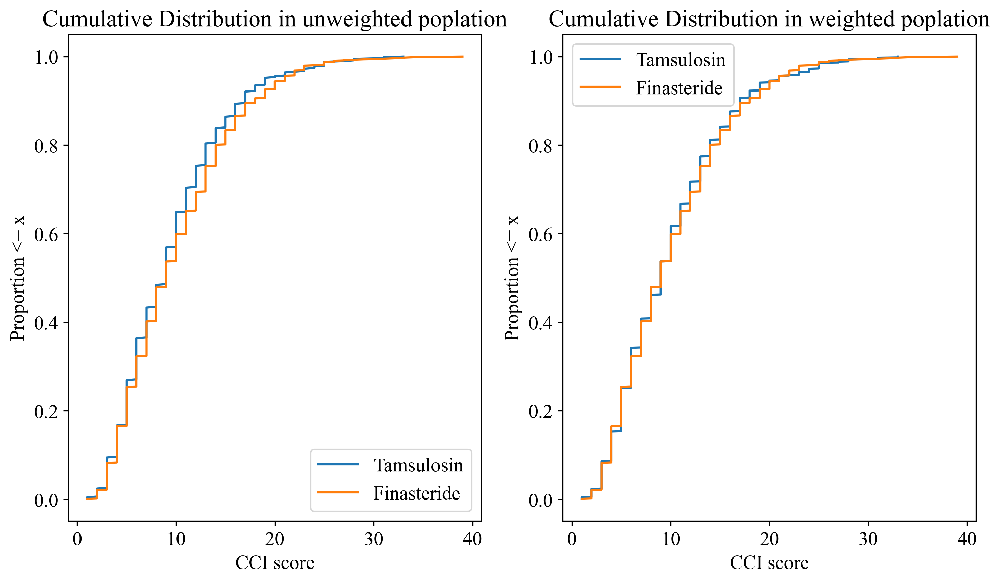

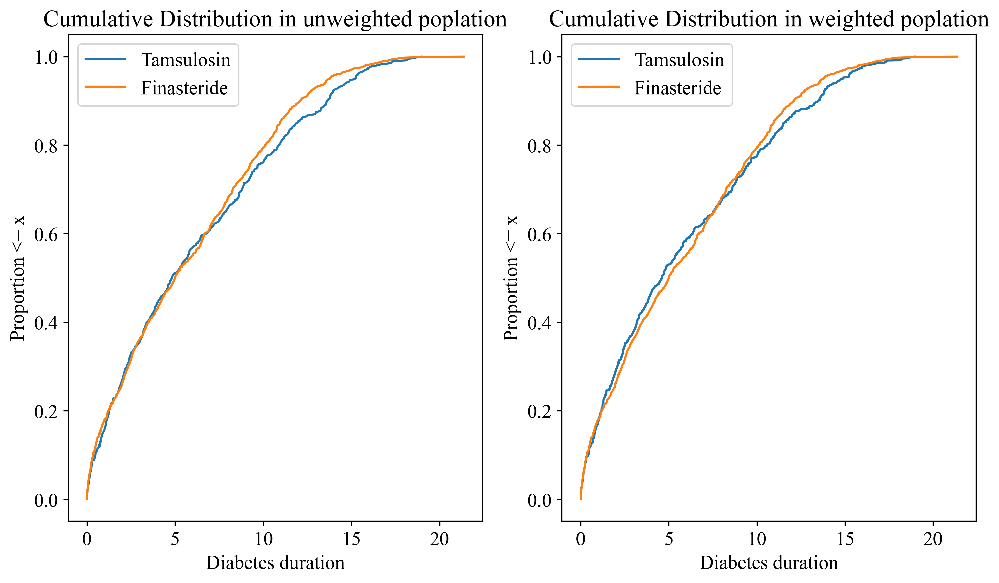

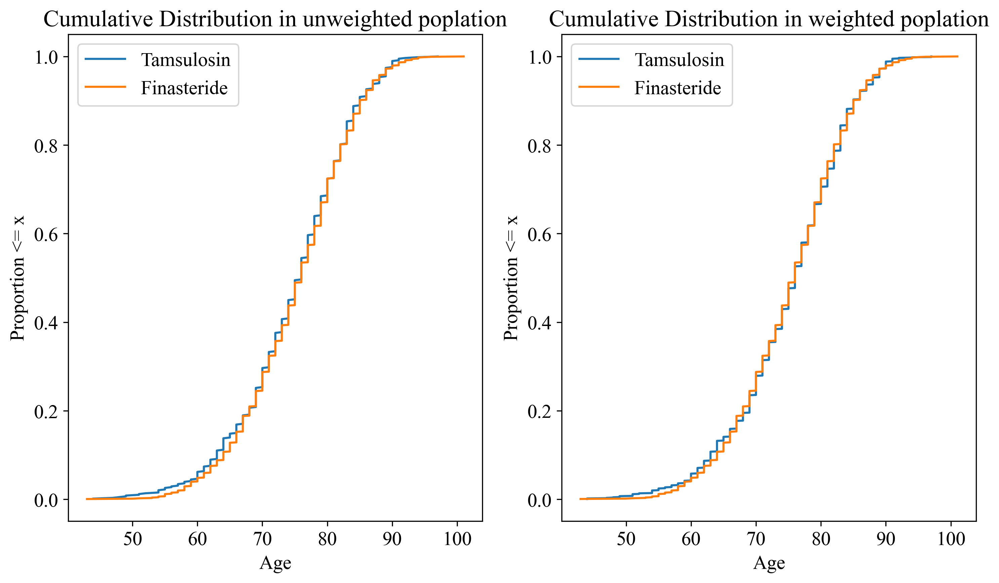

Treatment 0 (Finasteride): 1259 patients, 154 events, 1105 censored, 
              227.0 weighted events, 1837.0 total patients in weighted population
Treatment 1 (Tamsulosin): 580 patients, 67 events, 513 censored, 
              214.0 weighted events, 1836.0 total patients in weighted population


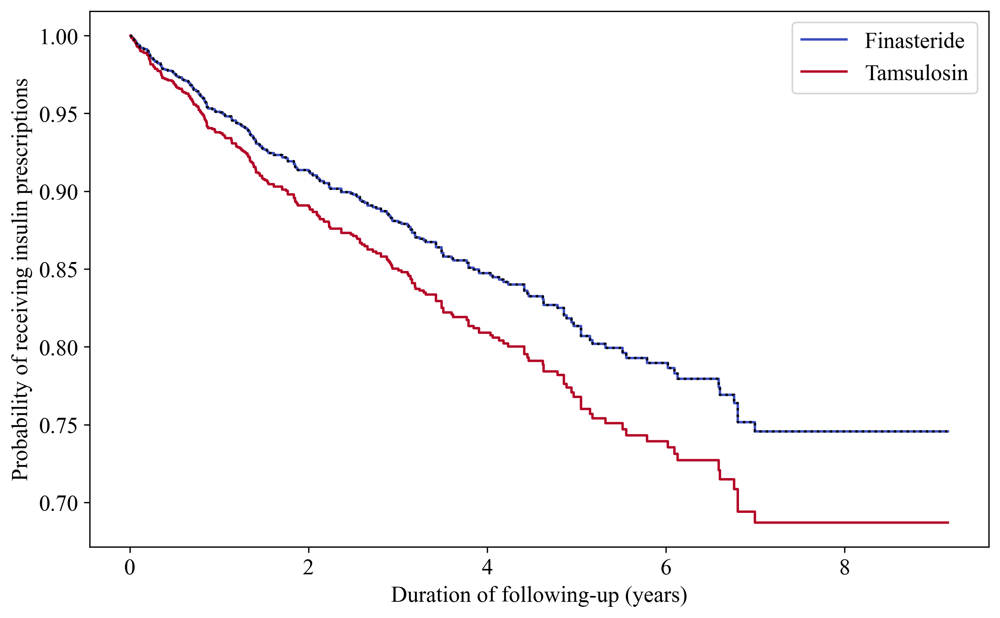

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.245968,1.278859,0.150208,-0.048434,0.54037,0.95272,1.716642,0.0,1.637517,0.101522,3.300129


In [288]:
cox_ipw_and_graphs(propensity_score_primary_df, 'Finasteride', 'Tamsulosin')

/opt/homebrew/anaconda3/lib/python3.11/site-packages/lifelines/fitters/kaplan_meier_fitter.py:338: StatisticalWarning: It looks like your weights are not integers, possibly propensity scores then?
  It's important to know that the naive variance estimates of the coefficients are biased. Instead use Monte Carlo to
  estimate the variances. See paper "Variance estimation when using inverse probability of treatment weighting (IPTW) with survival analysis"
  or "Adjusted Kaplan-Meier estimator and log-rank test with inverse probability of treatment weighting for survival data."
                  
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.11/site-packages/lifelines/fitters/kaplan_meier_fitter.py:338: StatisticalWarning: It looks like your weights are not integers, possibly propensity scores then?
  It's important to know that the naive variance estimates of the coefficients are biased. Instead use Monte Carlo to
  estimate the variances. See paper "Variance estimation when using 

Log-Rank Test p-value: 0.06837272776147701


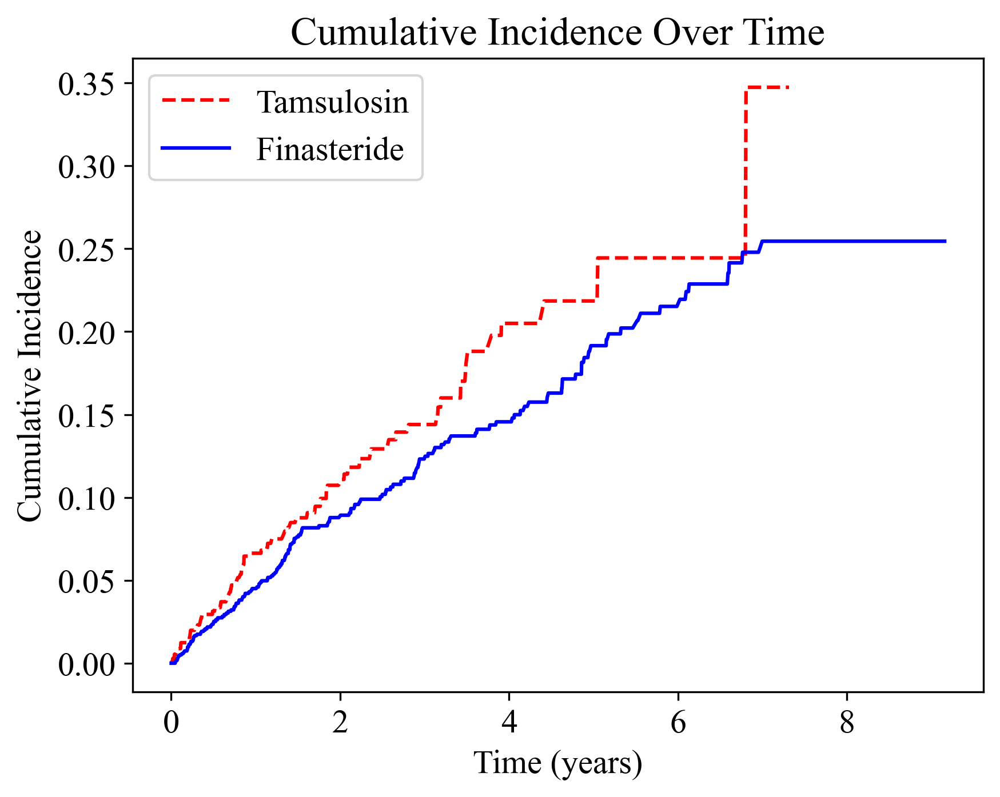

In [233]:
cumulative_incidence_weighted(propensity_score_primary_df, 'Finasteride', 'Tamsulosin')

## 3-month lag

In [234]:
#check lifelines version
import lifelines
lifelines.__version__

'0.27.8'

In [235]:
tamsulosin_df['duration_year'].describe()

count    580.000000
mean       2.046430
std        1.662130
min        0.016427
25%        0.705681
50%        1.615332
75%        3.075975
max        7.315537
Name: duration_year, dtype: float64

### Prepare data sets

In [236]:
# 3 months lag
# finasteride data set
finasteride_3_months_lag = apply_lag_time(finasteride_df, 0.25)

# tamsulosin data set
tamsulosin_3_months_lag = apply_lag_time(tamsulosin_df, 0.25)

print(f'Total finasteride patients after 3 months lag: {len(finasteride_3_months_lag)}')
print(f'Total tamsulosin patients after 3 months lag: {len(tamsulosin_3_months_lag)}')

#merge data sets
combined_3_month_lag_df = pd.concat([tamsulosin_3_months_lag, finasteride_3_months_lag], axis = 0)

Total finasteride patients after 3 months lag: 1259
Total tamsulosin patients after 3 months lag: 580


In [237]:
summarize_variables_before_weighted(combined_3_month_lag_df, variables, grouped_variables)

,Variable,Tamsulosin,Finasteride,Std Difference
0,Number of Patients,580,1259,NaN
1,start_age,74.77 (8.69),75.24 (8.29),0.055
2,duration_year,2.05 (1.66),2.99 (2.30),0.470
3,cci_score,9.50 (5.46),10.05 (5.75),0.099
4,diabetes_duration,6.08 (4.89),5.78 (4.51),0.063
5,metformin,472 (81.38%),1003 (79.67%),0.043
6,sulfonylureas,274 (47.24%),567 (45.04%),0.044
7,ACE_inhibitors,360 (62.07%),852 (67.67%),0.118
8,ARBs,109 (18.79%),186 (14.77%),0.108
9,Beta_blocker,310 (53.45%),634 (50.36%),0.062


Log-Rank Test p-value: 0.12767422411258922

Summary Table:
  Treatment Group  Insulin Status 0  Insulin Status 1   p-value
0     Finasteride              1121               138  0.127674
1      Tamsulosin               524                56          


 Year  Finasteride Number at risk  Tamsulosin Number at risk
    1                        1219                        550
    2                        1164                        526
    3                        1121                        505
    4                        1092                        471
    5                        1035                        463
    6                        1005                        450
    7                         953                        386
    8                         953                        386
    9                         953                        386

Cumulative Incidence for 3-month lag:
 Year  Finasteride Cumulative Incidence  Tamsulosin Cumulative Incidence
    1                    

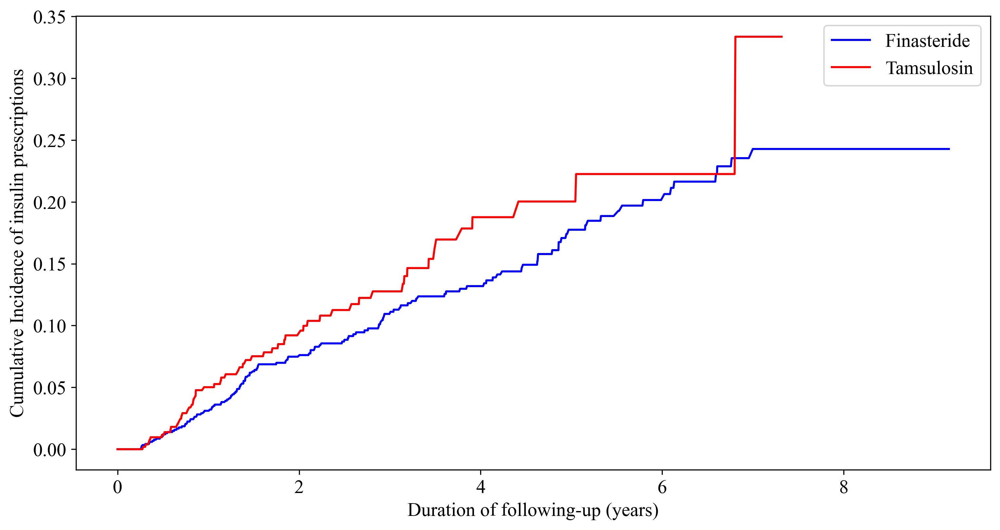

In [238]:
cumulative_incidence_and_km_plot(finasteride_3_months_lag, tamsulosin_3_months_lag, 'Finasteride', 'Tamsulosin', 'Cumulative Incidence for 3-month lag')

### Cox-model 

Treatment 0 (Finasteride): 1259 patients, 138 events, 1121 censored
Treatment 1 (Tamsulosin): 580 patients, 56 events, 524 censored


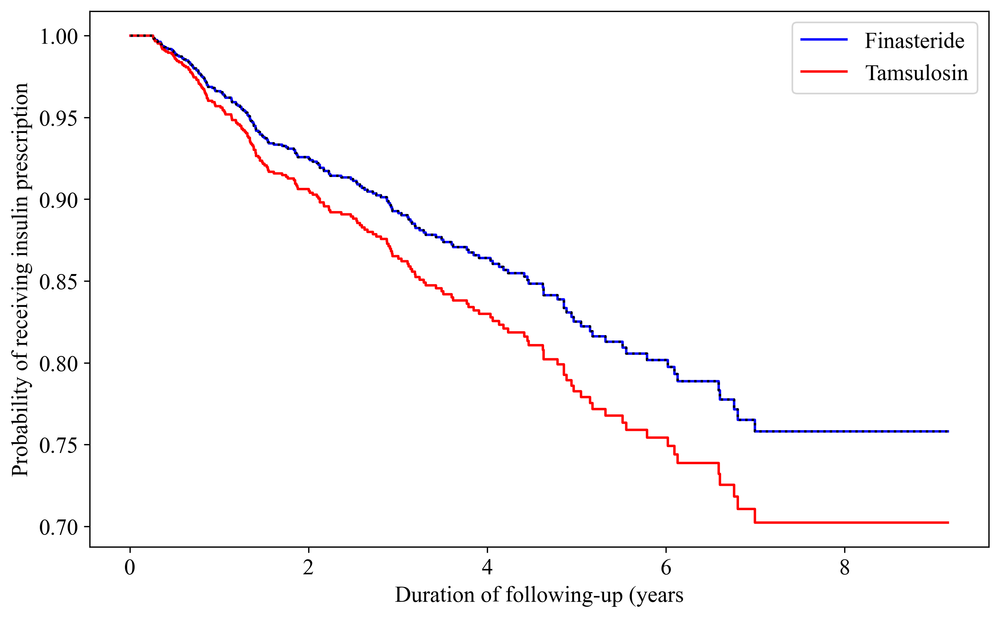

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.243627,1.275869,0.160294,-0.070543,0.557798,0.931888,1.746821,0.0,1.51988,0.128541,2.959699


In [239]:
#Unadjusted variables
Cox_proportional_model(tamsulosin_3_months_lag, finasteride_3_months_lag, 'Finasteride', 'Tamsulosin', unadjusted_variables)

Treatment 0 (finasteride): 1259 patients, 138 events, 1121 censored
Treatment 1 (tamsulosin): 580 patients, 56 events, 524 censored


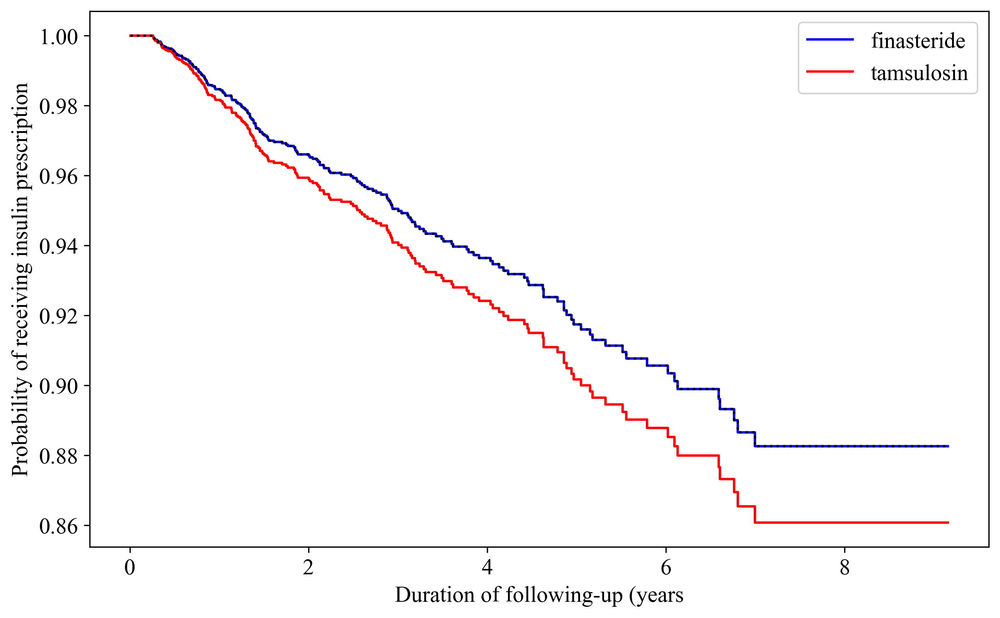

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.182826,1.200605,0.161882,-0.134458,0.500109,0.874190,1.648900,0.0,1.129375,2.587398e-01,1.950426
ACE_inhibitors,-0.325498,0.722168,0.171079,-0.660807,0.009812,0.516434,1.009860,0.0,-1.902613,5.709111e-02,4.130590
ARBs,-0.099856,0.904968,0.216253,-0.523705,0.323993,0.592322,1.382637,0.0,-0.461755,6.442570e-01,0.634292
Beta_blocker,0.033575,1.034145,0.151638,-0.263630,0.330781,0.768258,1.392054,0.0,0.221417,8.247681e-01,0.277940
diuretics,0.160118,1.173649,0.157146,-0.147884,0.468119,0.862531,1.596988,0.0,1.018908,3.082466e-01,1.697843
statin,-0.198465,0.819988,0.198371,-0.587265,0.190335,0.555845,1.209655,0.0,-1.000473,3.170814e-01,1.657075
start_age,-0.042901,0.958007,0.009814,-0.062135,-0.023666,0.939756,0.976611,0.0,-4.371565,1.233591e-05,16.306777
cci_score,0.045483,1.046533,0.012333,0.021312,0.069655,1.021540,1.072138,0.0,3.688022,2.260042e-04,12.111363
diabetes_duration,0.002998,1.003003,0.017559,-0.031417,0.037414,0.969071,1.038122,0.0,0.170746,8.644233e-01,0.210190


In [240]:
#Adjusted
Cox_proportional_model(tamsulosin_3_months_lag, finasteride_3_months_lag, 'finasteride','tamsulosin', variables)

### Propensity score

In [241]:
#propensity score for 3 months lag
propensity_score_df_3_month_lag= estimate_propensity_scores(finasteride_3_months_lag, tamsulosin_3_months_lag)  

In [242]:
summarize_variables_before_weighted(combined_3_month_lag_df,summary_variables,grouped_variables)

,Variable,Tamsulosin,Finasteride,Std Difference
0,Number of Patients,580,1259,NaN
1,start_age,74.77 (8.69),75.24 (8.29),0.055
2,duration_year,2.05 (1.66),2.99 (2.30),0.470
3,cci_score,9.50 (5.46),10.05 (5.75),0.099
4,diabetes_duration,6.08 (4.89),5.78 (4.51),0.063
5,metformin,472 (81.38%),1003 (79.67%),0.043
6,sulfonylureas,274 (47.24%),567 (45.04%),0.044
7,acarbose,0 (0.00%),0 (0.00%),nan
8,GLP_1,0 (0.00%),0 (0.00%),nan
9,DPP_4,0 (0.00%),0 (0.00%),nan


                                  Variable     Tamsulosin    Finasteride  \
0                       Number of Patients            580           1259   
1                                start_age   75.08 (8.62)   75.10 (8.30)   
2                            duration_year    2.08 (1.66)    2.97 (2.29)   
3                                cci_score    9.87 (5.66)    9.89 (5.66)   
4                        diabetes_duration    5.83 (4.83)    5.87 (4.53)   
5                                metformin  1476 (80.38%)  1474 (80.21%)   
6                            sulfonylureas   836 (45.53%)   839 (45.65%)   
7                           ACE_inhibitors  1213 (66.07%)  1213 (66.03%)   
8                                     ARBs   296 (16.12%)   294 (16.01%)   
9                             Beta_blocker   948 (51.62%)   943 (51.31%)   
10                               diuretics   709 (38.60%)   715 (38.90%)   
11                                  statin  1524 (83.01%)  1521 (82.79%)   
12          

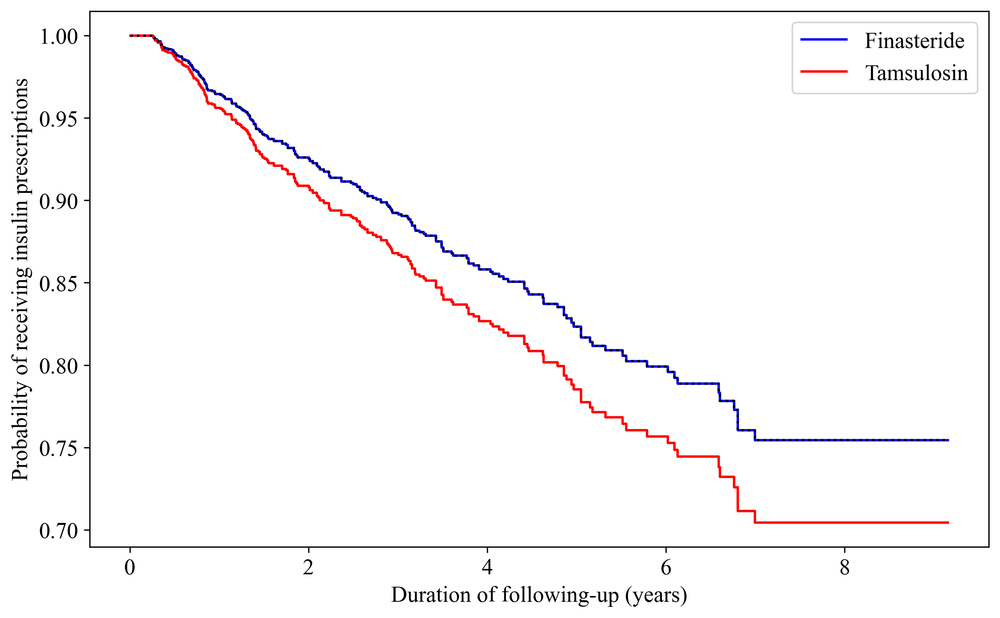

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.217928,1.243497,0.16287,-0.101292,0.537147,0.903669,1.711118,0.0,1.338046,0.180881,2.466885


In [243]:
#ipw 3 monhts lag
cox_ipw(propensity_score_df_3_month_lag, 'Finasteride', 'Tamsulosin', )

## 6-month lag

In [244]:
# 6 months lag
# finasteride data set
finasteride_6_months_lag = apply_lag_time(finasteride_df, 0.5)

# tamsulosin data set
tamsulosin_6_months_lag = apply_lag_time(tamsulosin_df, 0.5)

print(f'Total finasteride patients after 6 months lag: {len(finasteride_6_months_lag)}')
print(f'Total tamsulosin patients after 6 months lag: {len(tamsulosin_6_months_lag)}')

#merge data sets
combined_3_month_lag_df = pd.concat([tamsulosin_6_months_lag, finasteride_6_months_lag], axis = 0)

Total finasteride patients after 6 months lag: 1259
Total tamsulosin patients after 6 months lag: 580


Log-Rank Test p-value: 0.1266910370736397

Summary Table:
  Treatment Group  Insulin Status 0  Insulin Status 1   p-value
0     Finasteride              1133               126  0.126691
1      Tamsulosin               530                50          


 Year  Finasteride Number at risk  Tamsulosin Number at risk
    1                        1232                        557
    2                        1176                        532
    3                        1132                        511
    4                        1104                        476
    5                        1046                        469
    6                        1015                        456
    7                         963                        391
    8                         963                        391
    9                         963                        391

Cumulative Incidence for 6-month lag:
 Year  Finasteride Cumulative Incidence  Tamsulosin Cumulative Incidence
    1                     

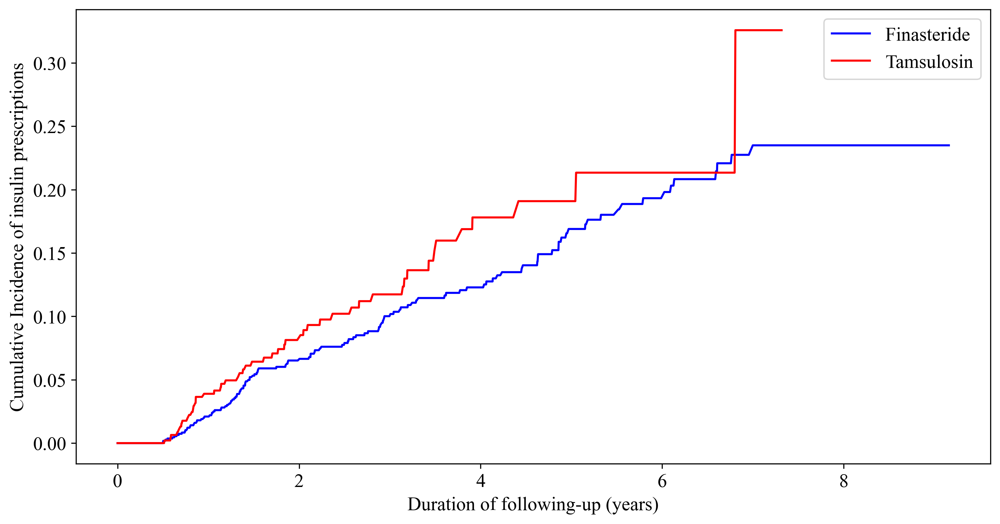

In [245]:
#Kaplan-Meier for 6 months lag
cumulative_incidence_and_km_plot(finasteride_6_months_lag, tamsulosin_6_months_lag, 'Finasteride', 'Tamsulosin', 'Cumulative Incidence for 6-month lag')

In [246]:
# # 6 months lag
# # finasteride data set
# finasteride_6_months_lag = apply_lag_time(finasteride_df, 0.5)

# # tamsulosin data set
# tamsulosin_6_months_lag = apply_lag_time(tamsulosin_df, 0.5)

print(f'Total finasteride patients after 6 months lag: {len(finasteride_6_months_lag)}')
print(f'Total tamsulosin patients after 6 months lag: {len(tamsulosin_6_months_lag)}')

#merge data sets
combined_6_month_lag_df = pd.concat([tamsulosin_6_months_lag, finasteride_6_months_lag], axis = 0)

Total finasteride patients after 6 months lag: 1259
Total tamsulosin patients after 6 months lag: 580


Treatment 0 (Finasteride): 1259 patients, 126 events, 1133 censored
Treatment 1 (Tamsulosin): 580 patients, 50 events, 530 censored


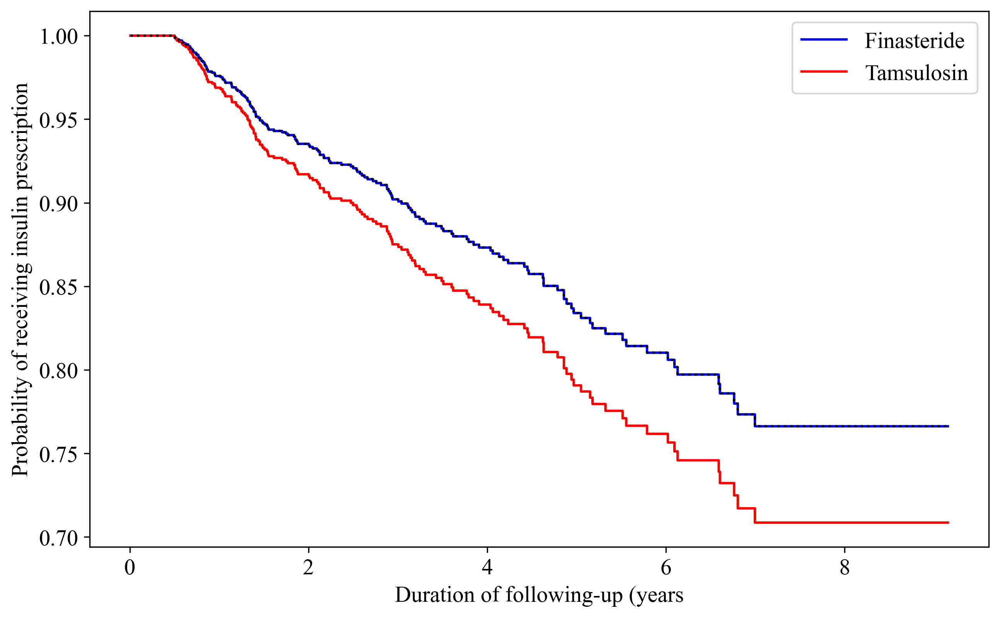

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.257535,1.293738,0.169106,-0.073906,0.588976,0.928759,1.802143,0.0,1.522926,0.127777,2.968298


In [247]:
#Unadjusted
Cox_proportional_model(tamsulosin_6_months_lag, finasteride_6_months_lag, 'Finasteride', 'Tamsulosin', unadjusted_variables)

Treatment 0 (tamsulosin): 1259 patients, 126 events, 1133 censored
Treatment 1 (finasteride): 580 patients, 50 events, 530 censored


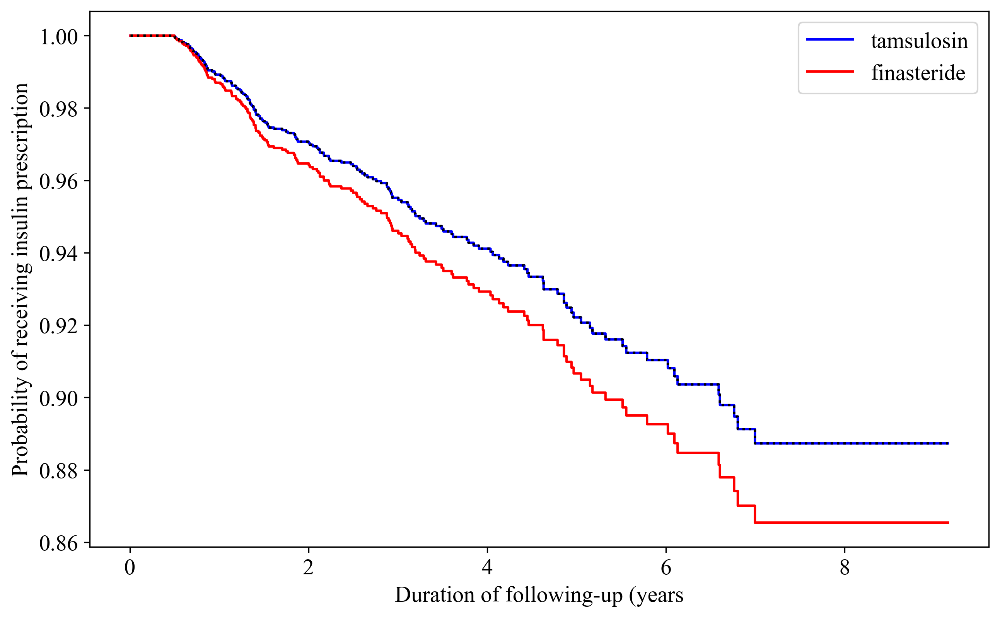

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.189736,1.208930,0.170915,-0.145251,0.524723,0.864805,1.689991,0.0,1.110118,2.669480e-01,1.905370
ACE_inhibitors,-0.364610,0.694467,0.179085,-0.715610,-0.013610,0.488894,0.986482,0.0,-2.035962,4.175413e-02,4.581937
ARBs,-0.155441,0.856038,0.229101,-0.604471,0.293589,0.546364,1.341232,0.0,-0.678482,4.974658e-01,1.007331
Beta_blocker,0.009326,1.009370,0.159080,-0.302464,0.321117,0.738995,1.378667,0.0,0.058627,9.532489e-01,0.069075
diuretics,0.153136,1.165484,0.165286,-0.170819,0.477091,0.842974,1.611381,0.0,0.926490,3.541914e-01,1.497399
statin,-0.242635,0.784558,0.205798,-0.645992,0.160722,0.524142,1.174358,0.0,-1.178996,2.383998e-01,2.068545
start_age,-0.040702,0.960115,0.010341,-0.060970,-0.020435,0.940852,0.979772,0.0,-3.936137,8.280369e-05,13.559945
cci_score,0.043846,1.044821,0.012968,0.018428,0.069263,1.018599,1.071718,0.0,3.380977,7.222862e-04,10.435142
diabetes_duration,0.009499,1.009544,0.018532,-0.026823,0.045822,0.973533,1.046888,0.0,0.512577,6.082475e-01,0.717269


In [248]:
#Adjusted
Cox_proportional_model(tamsulosin_6_months_lag, finasteride_6_months_lag, 'tamsulosin', 'finasteride', variables)

### Propensity score

In [249]:
#propensity score calculation
propensity_score_df_6_month_lag= estimate_propensity_scores(finasteride_6_months_lag, tamsulosin_6_months_lag)

                                  Variable     Tamsulosin    Finasteride  \
0                       Number of Patients            580           1259   
1                                start_age   75.08 (8.62)   75.10 (8.30)   
2                            duration_year    2.08 (1.66)    2.97 (2.29)   
3                                cci_score    9.87 (5.66)    9.89 (5.66)   
4                        diabetes_duration    5.83 (4.83)    5.87 (4.53)   
5                                metformin  1476 (80.38%)  1474 (80.21%)   
6                            sulfonylureas   836 (45.53%)   839 (45.65%)   
7                           ACE_inhibitors  1213 (66.07%)  1213 (66.03%)   
8                                     ARBs   296 (16.12%)   294 (16.01%)   
9                             Beta_blocker   948 (51.62%)   943 (51.31%)   
10                               diuretics   709 (38.60%)   715 (38.90%)   
11                                  statin  1524 (83.01%)  1521 (82.79%)   
12          

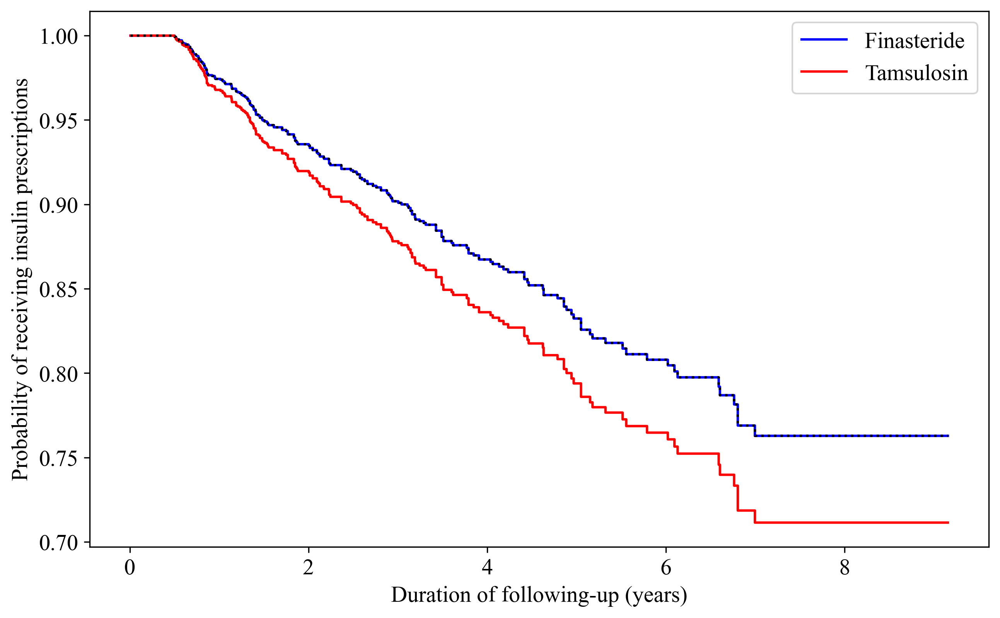

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.229335,1.257763,0.171891,-0.107565,0.566235,0.898018,1.761623,0.0,1.334189,0.182142,2.456865


In [250]:
#IPTW for 6 months lag
cox_ipw(propensity_score_df_6_month_lag, 'Finasteride', 'Tamsulosin')

## 9-month lag

In [251]:
#Prepare the data sets for 9-month lag
# finasteride data set
finasteride_9_months_lag = apply_lag_time(finasteride_df, 0.75)
#tamsulosin data set
tamsulosin_9_months_lag = apply_lag_time(tamsulosin_df, 0.75)
print(f'There are {len(finasteride_9_months_lag)} patients in the finasteride data set after 9 months lag')
print(f'There are {len(tamsulosin_9_months_lag)} patients in the tamsulosin data set after 9 months lag')

There are 1259 patients in the finasteride data set after 9 months lag
There are 580 patients in the tamsulosin data set after 9 months lag


Log-Rank Test p-value: 0.23608058606630622

Summary Table:
  Treatment Group  Insulin Status 0  Insulin Status 1   p-value
0     Finasteride              1144               115  0.236081
1      Tamsulosin               538                42          


 Year  Finasteride Number at risk  Tamsulosin Number at risk
    1                        1245                        567
    2                        1189                        542
    3                        1144                        521
    4                        1115                        485
    5                        1057                        477
    6                        1026                        464
    7                         973                        398
    8                         973                        398
    9                         973                        398

Cumulative Incidence for 9-month lag:
 Year  Finasteride Cumulative Incidence  Tamsulosin Cumulative Incidence
    1                    

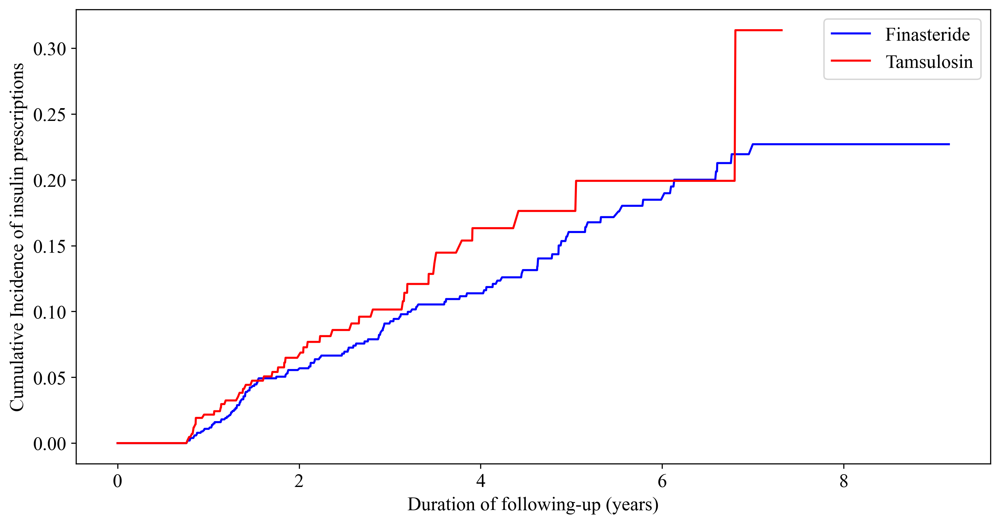

In [252]:
#weighted incidence curve
cumulative_incidence_and_km_plot(finasteride_9_months_lag, tamsulosin_9_months_lag, 'Finasteride', 'Tamsulosin', 'Cumulative Incidence for 9-month lag')

Treatment 0 (Finasteride): 1259 patients, 115 events, 1144 censored
Treatment 1 (Tamsulosin): 580 patients, 42 events, 538 censored


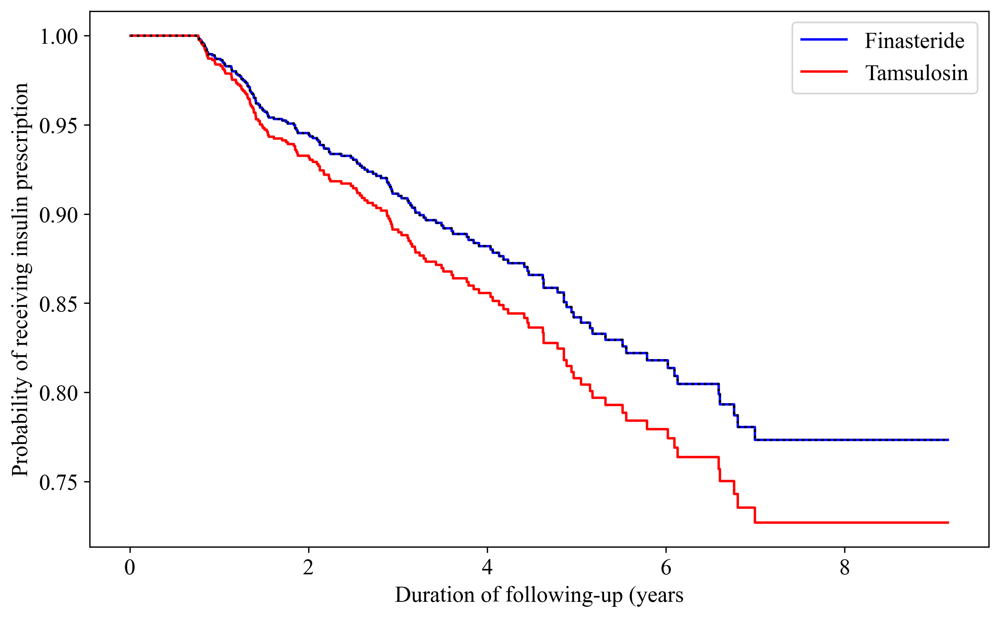

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.21562,1.240631,0.182348,-0.141775,0.573016,0.867816,1.773608,0.0,1.182465,0.237021,2.076912


In [253]:
#Un-adjusted
Cox_proportional_model(tamsulosin_9_months_lag,finasteride_9_months_lag, 'Finasteride', 'Tamsulosin', unadjusted_variables)

                                  Variable     Tamsulosin    Finasteride  \
0                       Number of Patients            580           1259   
1                                start_age   75.08 (8.62)   75.10 (8.30)   
2                            duration_year    2.08 (1.66)    2.97 (2.29)   
3                                cci_score    9.87 (5.66)    9.89 (5.66)   
4                        diabetes_duration    5.83 (4.83)    5.87 (4.53)   
5                                metformin  1476 (80.38%)  1474 (80.21%)   
6                            sulfonylureas   836 (45.53%)   839 (45.65%)   
7                           ACE_inhibitors  1213 (66.07%)  1213 (66.03%)   
8                                     ARBs   296 (16.12%)   294 (16.01%)   
9                             Beta_blocker   948 (51.62%)   943 (51.31%)   
10                               diuretics   709 (38.60%)   715 (38.90%)   
11                                  statin  1524 (83.01%)  1521 (82.79%)   
12          

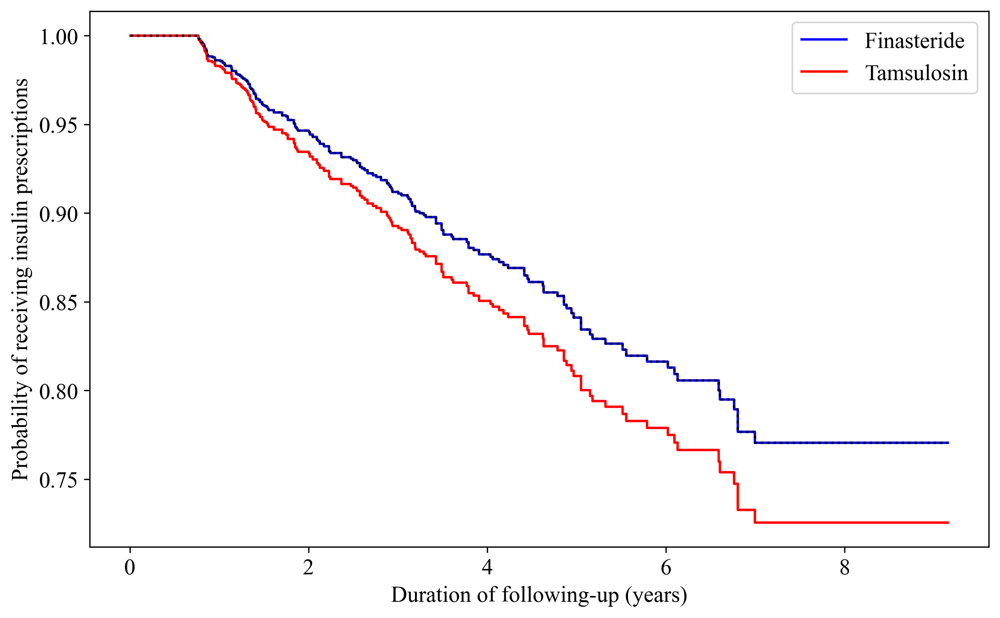

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.207648,1.230779,0.185412,-0.155754,0.571049,0.85577,1.770123,0.0,1.119923,0.262747,1.928255


In [254]:
#IPTW for 9-month lag
propensity_score_df_9_month_lag= estimate_propensity_scores(finasteride_9_months_lag, tamsulosin_9_months_lag)
cox_ipw(propensity_score_df_9_month_lag, 'Finasteride', 'Tamsulosin')

### 1-year lag analysis

In [255]:
# 12 months lag
# finasteride data set
finasteride_12_months_lag = apply_lag_time(finasteride_df, 1)

# tamsulosin data set
tamsulosin_12_months_lag = apply_lag_time(tamsulosin_df, 1)

#combined df for 12 months lag
combined_12_month_lag_df = pd.concat([finasteride_12_months_lag, tamsulosin_12_months_lag], axis = 0)

Log-Rank Test p-value: 0.5399635066948207

Summary Table:
  Treatment Group  Insulin Status 0  Insulin Status 1   p-value
0     Finasteride              1155               104  0.539964
1      Tamsulosin               547                33          


 Year  Finasteride Number at risk  Tamsulosin Number at risk
    1                        1259                        580
    2                        1202                        554
    3                        1157                        532
    4                        1127                        496
    5                        1068                        488
    6                        1037                        474
    7                         983                        406
    8                         983                        406
    9                         983                        406

Cumulative Incidence for 12-month lag:
 Year  Finasteride Cumulative Incidence  Tamsulosin Cumulative Incidence
    1                    

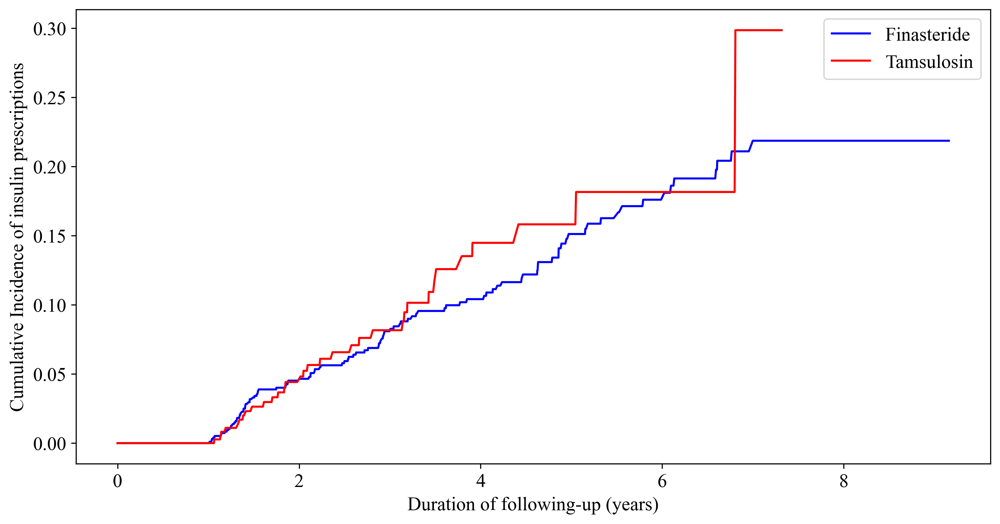

In [256]:
#cummulative incidence
cumulative_incidence_and_km_plot(finasteride_12_months_lag, tamsulosin_12_months_lag, 'Finasteride', 'Tamsulosin', 'Cumulative Incidence for 12-month lag')

Treatment 0 (tamsulosin): 1259 patients, 104 events, 1155 censored
Treatment 1 (finasteride): 580 patients, 33 events, 547 censored


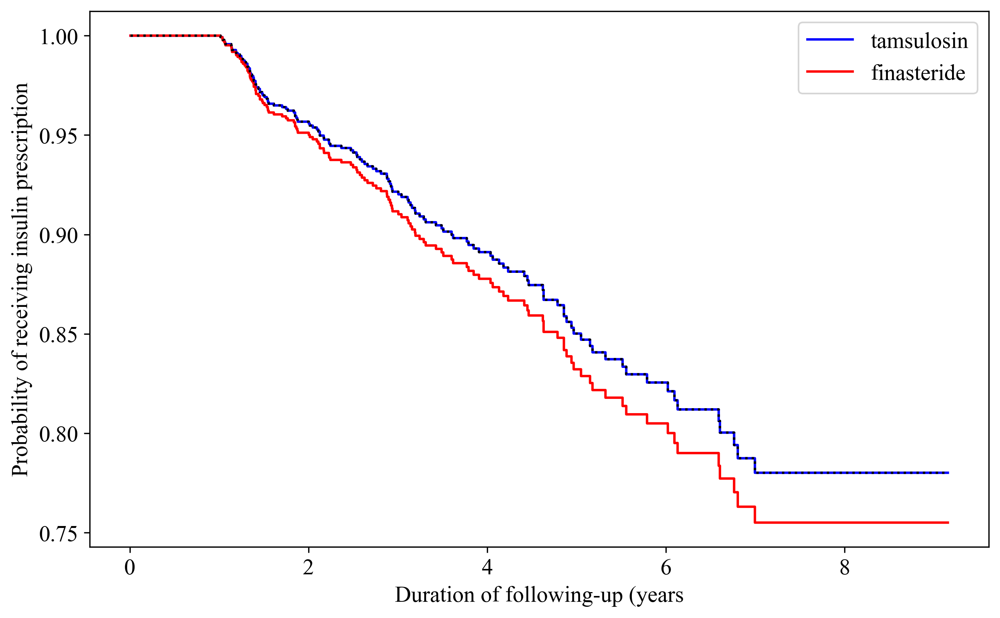

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.123606,1.131571,0.201935,-0.272179,0.519392,0.761718,1.681006,0.0,0.61211,0.540465,0.887726


In [257]:
#Crude HR for 1 year lag
Cox_proportional_model(tamsulosin_12_months_lag, finasteride_12_months_lag, 'tamsulosin', 'finasteride', unadjusted_variables)

In [258]:
#calculate propensity score for 12 months lag
propensity_score_df_12_months_lag = estimate_propensity_scores(tamsulosin_12_months_lag, finasteride_12_months_lag)

#### IPTW for 12-month lag  

In [259]:
#summary variables
summarize_variables_before_weighted(combined_12_month_lag_df, summary_variables, grouped_variables)

,Variable,Tamsulosin,Finasteride,Std Difference
0,Number of Patients,580,1259,NaN
1,start_age,74.77 (8.69),75.24 (8.29),0.055
2,duration_year,2.05 (1.66),2.99 (2.30),0.470
3,cci_score,9.50 (5.46),10.05 (5.75),0.099
4,diabetes_duration,6.08 (4.89),5.78 (4.51),0.063
5,metformin,472 (81.38%),1003 (79.67%),0.043
6,sulfonylureas,274 (47.24%),567 (45.04%),0.044
7,acarbose,0 (0.00%),0 (0.00%),nan
8,GLP_1,0 (0.00%),0 (0.00%),nan
9,DPP_4,0 (0.00%),0 (0.00%),nan


                                  Variable     Tamsulosin    Finasteride  \
0                       Number of Patients            580           1259   
1                                start_age   75.08 (8.63)   75.10 (8.30)   
2                            duration_year    2.08 (1.66)    2.97 (2.29)   
3                                cci_score    9.87 (5.66)    9.89 (5.66)   
4                        diabetes_duration    5.83 (4.83)    5.87 (4.53)   
5                                metformin  1476 (80.40%)  1473 (80.20%)   
6                            sulfonylureas   837 (45.58%)   838 (45.63%)   
7                           ACE_inhibitors  1213 (66.07%)  1213 (66.03%)   
8                                     ARBs   296 (16.13%)   294 (16.00%)   
9                             Beta_blocker   947 (51.58%)   943 (51.32%)   
10                               diuretics   709 (38.62%)   715 (38.90%)   
11                                  statin  1524 (83.03%)  1521 (82.79%)   
12          

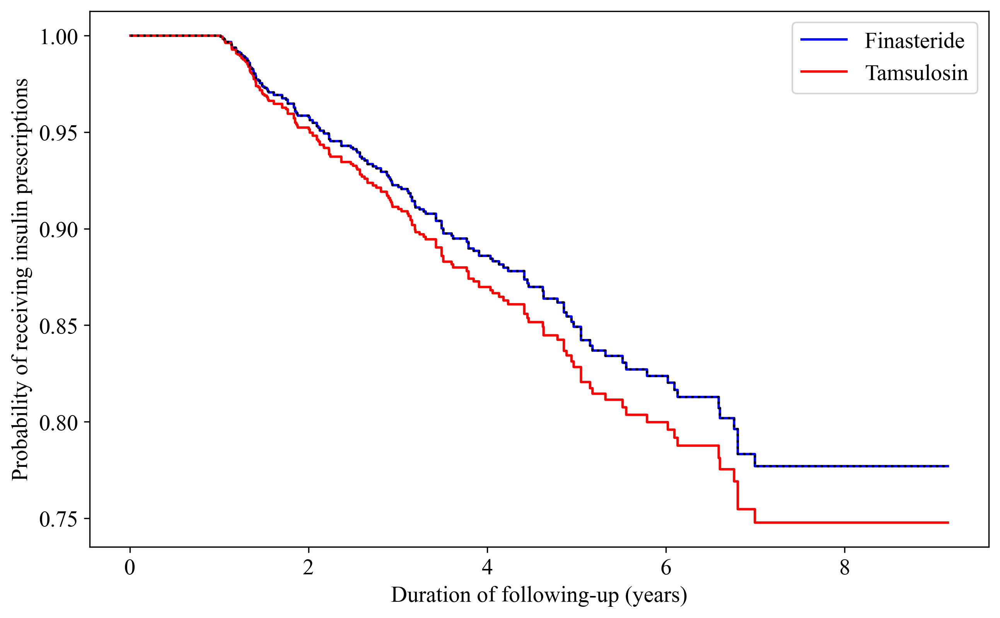

,coef,exp(coef),se(coef),coef lower 95%,coef upper 95%,exp(coef) lower 95%,exp(coef) upper 95%,cmp to,z,p,-log2(p)
covariate,,,,,,,,,,,
Treatment,0.141465,1.15196,0.205919,-0.262128,0.545058,0.769412,1.724708,0.0,0.686993,0.492087,1.023014


In [260]:
#IPTW for 12-month lag
cox_ipw(propensity_score_df_12_months_lag, 'Finasteride', 'Tamsulosin')

### Strata

Median CCI score: 9.00
Scenario_1:
Lower stratum:
                                  Variable    Tamsulosin   Finasteride  \
0                       Number of Patients           330           676   
1                                start_age  72.47 (8.82)  72.52 (8.26)   
2                            duration_year   1.97 (1.65)   2.92 (2.29)   
3                                cci_score   5.77 (2.04)   5.77 (2.04)   
4                        diabetes_duration   5.08 (4.57)   5.07 (4.44)   
5                                metformin  829 (82.61%)  830 (82.57%)   
6                            sulfonylureas  385 (38.34%)  390 (38.78%)   
7                           ACE_inhibitors  631 (62.90%)  635 (63.11%)   
8                                     ARBs  166 (16.52%)  164 (16.27%)   
9                             Beta_blocker  472 (47.08%)  466 (46.36%)   
10                               diuretics  288 (28.67%)  282 (28.10%)   
11                                  statin  842 (83.96%)  842 

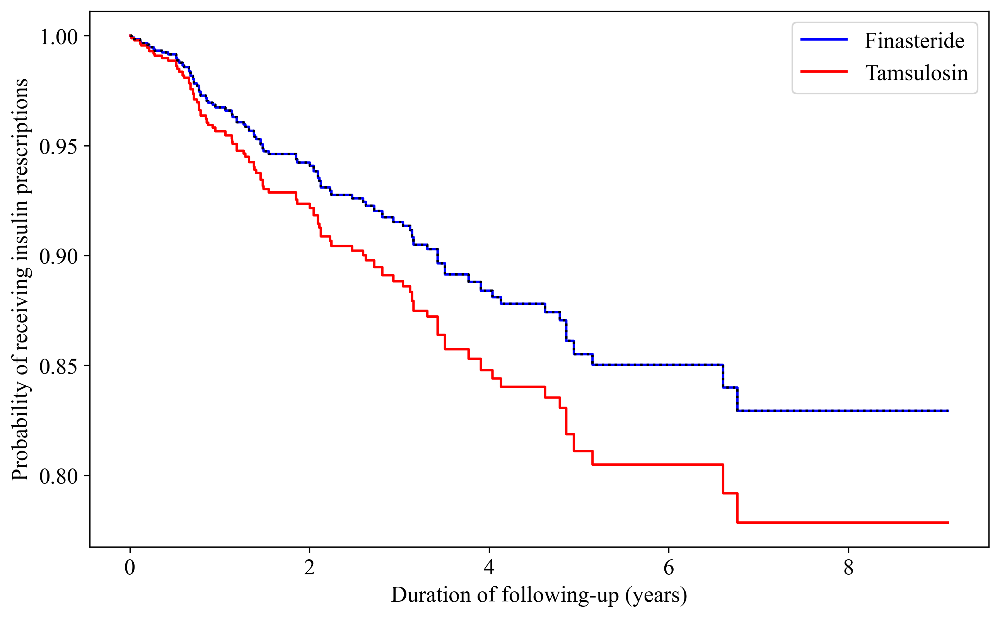

Higher stratum:
                                  Variable    Tamsulosin   Finasteride  \
0                       Number of Patients           250           583   
1                                start_age  78.25 (6.93)  78.21 (7.31)   
2                            duration_year   2.27 (1.69)   3.06 (2.29)   
3                                cci_score  14.84 (4.81)  14.85 (4.46)   
4                        diabetes_duration   6.70 (4.97)   6.82 (4.43)   
5                                metformin  639 (77.34%)  643 (77.28%)   
6                            sulfonylureas  438 (53.05%)  446 (53.62%)   
7                           ACE_inhibitors  569 (68.91%)  579 (69.49%)   
8                                     ARBs  131 (15.89%)  131 (15.76%)   
9                             Beta_blocker  481 (58.27%)  480 (57.60%)   
10                               diuretics  423 (51.26%)  434 (52.10%)   
11                                  statin  681 (82.40%)  680 (81.69%)   
12                    

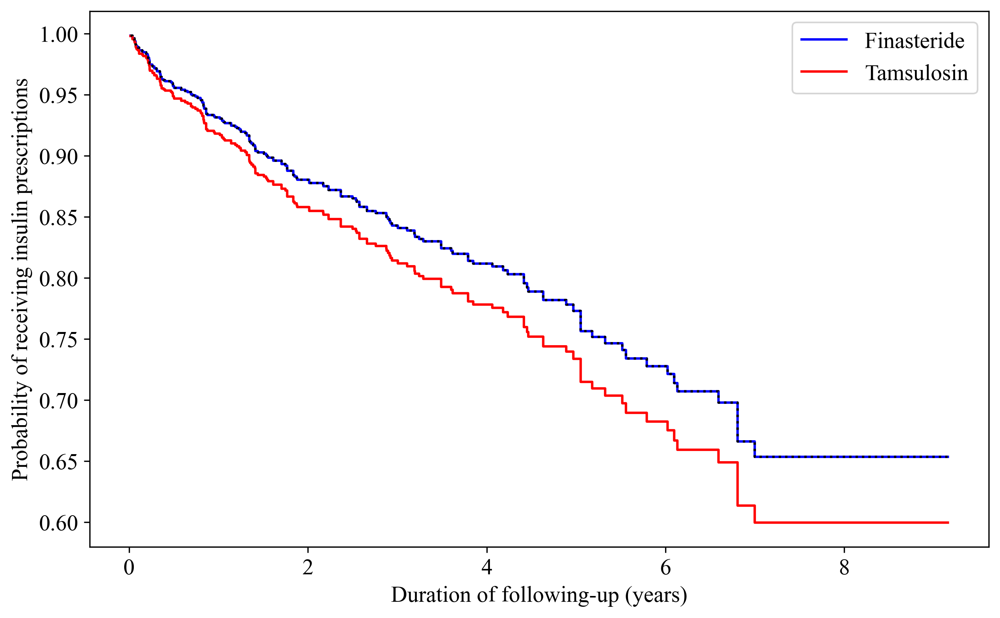

[             coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
 covariate                                                                
 Treatment  0.2914     1.3383  0.239868       -0.178733        0.761534   
 
            exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
 covariate                                                               
 Treatment             0.836329             2.141559     0.0  1.214834   
 
                   p  -log2(p)  
 covariate                      
 Treatment  0.224429  2.155667  ,
                coef  exp(coef)  se(coef)  coef lower 95%  coef upper 95%  \
 covariate                                                                  
 Treatment  0.184085   1.202119  0.193985       -0.196118        0.564289   
 
            exp(coef) lower 95%  exp(coef) upper 95%  cmp to         z  \
 covariate                                                               
 Treatment             0.821915             1.758198     0.0  0.9489

In [261]:
#strata for primary analysis
run_cox_models_percentile_strata(finasteride_df, tamsulosin_df, 'Finasteride', 'Tamsulosin')

## Forest plot

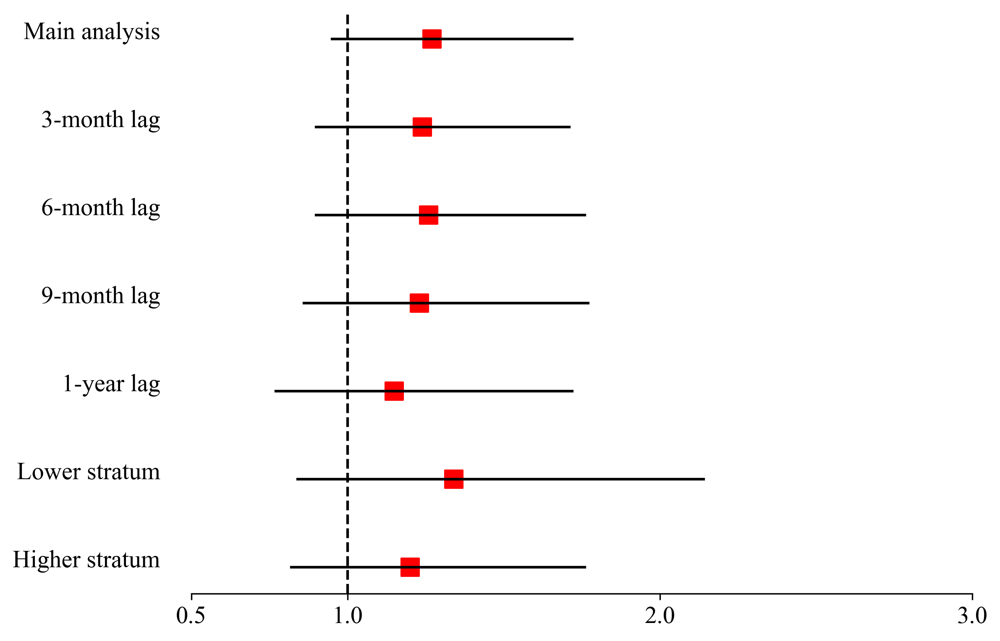

In [262]:
import matplotlib.pyplot as plt

# Study data
studies = ['Main analysis','3-month lag', '6-month lag', '9-month lag', '1-year lag', 'Lower stratum', 'Higher stratum']
mean = [1.27, 1.24, 1.26, 1.23, 1.15, 1.34, 1.20 ]
ci_lower = [0.95, 0.90, 0.90, 0.86, 0.77, 0.84, 0.82 ]
ci_upper = [1.72, 1.71, 1.76, 1.77, 1.72, 2.14, 1.76 ]

# Create a new figure and a subplot
fig, ax = plt.subplots(figsize=(8, 6), dpi = 300)

# Plot the mean values with larger markers
ax.scatter(mean, list(range(len(studies))), marker='s', color='red', s=100)

# Plot the confidence intervals
for i, study in enumerate(studies):
    ax.plot([ci_lower[i], ci_upper[i]], [i, i], color='black')

# Set the x-axis limits to be centered around 1
ax.set_xlim(0.5, 2)

# Remove the borders of the plot and y axis
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.get_yaxis().set_visible(False)

# Add a vertical line at x=1.0
ax.axvline(x=1.0, color='black', linestyle='--')

# Set the x-axis ticks
ax.set_xticks([0.5, 1.0, 2.0, 3.0])

# Remove labels and title
ax.set_xlabel('')
ax.set_title('')

# Invert the y-axis

ax.invert_yaxis()# Annotate the names of the studies at each point
for i, study in enumerate(studies):
    ax.text(0.4, i, study, ha='right')

plt.show()